In [1]:
import pandas as pd
import numpy as np
import nibabel as nib
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl

(np.float64(-0.5), np.float64(255.5), np.float64(0.5), np.float64(-0.5))

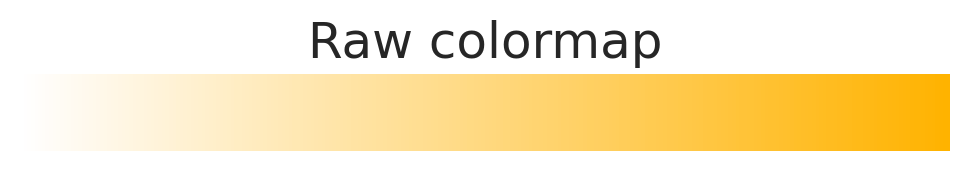

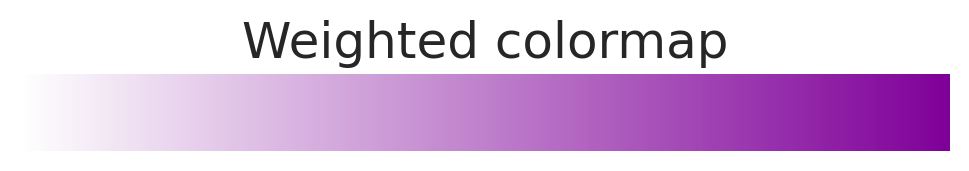

In [2]:
# ── Global visualisation configuration ──────────────────────────────────────

# 1.  General Matplotlib defaults
# ── Global visualisation configuration ──────────────────────────────────────
import matplotlib as mpl
import seaborn as sns

mpl.rcParams.update(
    {
        # ── Canvas size & resolution ───────────────────────────────────────────
        # Default figure size: 12×8 inches  →  4800×3200 px when exported at 400 dpi
        "figure.figsize": (12, 8),
        "figure.dpi": 200,  # crisp in-notebook / retina preview
        "savefig.dpi": 400,  # print-quality PNG/PDF
        # ── Fonts ──────────────────────────────────────────────────────────────
        "font.family": "sans-serif",
        "font.sans-serif": ["Roboto", "DejaVu Sans", "Arial"],
        "axes.titlesize": 24,
        # "axes.titleweight": "bold",
        "axes.labelsize": 24,
        "xtick.labelsize": 14,
        "ytick.labelsize": 14,
        "legend.fontsize": 20,
        # ── Axis & spine aesthetics ────────────────────────────────────────────
        "axes.spines.top": False,
        "axes.spines.right": False,
        "axes.spines.left": True,
        "axes.spines.bottom": True,
        "axes.linewidth": 1,
        "axes.grid": True,
        "grid.color": "#E6E6E6",
        "grid.linewidth": 0.4,
        "grid.alpha": 0.8,
        # ── Colour cycle (colour-blind-safe) ───────────────────────────────────
        "axes.prop_cycle": mpl.cycler(color=sns.color_palette("Set2")),
        # ── Figure background ─────────────────────────────────────────────────
        "figure.facecolor": "white",
    }
)

# Seaborn theme inherits the rcParams above
sns.set_theme(context="talk", style="whitegrid", palette="Set2")


# 2.  Seaborn theme (inherits Matplotlib rcParams)
sns.set_theme(
    context="talk",  # slightly larger fonts for presentations / papers
    style="whitegrid",  # grid only on y-axis (good for histograms)
    palette="Set2",  # matches the rcParams colour cycle
)


# 3.  Helper function for consistent figure export
def savefig_nice(fig, filename, *, tight=True, dpi=300, **savefig_kwargs):
    """Save figure with tight layout and correct DPI."""
    if tight:
        fig.tight_layout()
    fig.savefig(filename, dpi=dpi, bbox_inches="tight", transparent=True, **savefig_kwargs)


# 4.  Colour constants for this project (optional convenience)
# COL_RAW = "#1f77b4"  # e.g. unweighted sample
COL_RAW = "#ffb300"
# COL_WEIGHTED = "#d62728"  # weighted sample
COL_WEIGHTED = "#7F0099CE"  # weighted sample
COL_REF = "0.25"  # census reference (neutral grey)
COL_CENSUS = "#A5A5A5"

# generate colormaps from white to colour
COL_WHITE = "white"
COL_RAW_RGB = mpl.colors.to_rgb(COL_RAW)
COL_WEIGHTED_RGB = mpl.colors.to_rgb(COL_WEIGHTED)
CMAP_RAW = mpl.colors.LinearSegmentedColormap.from_list("raw", [COL_WHITE, COL_RAW_RGB], N=256)
CMAP_WEIGHTED = mpl.colors.LinearSegmentedColormap.from_list(
    "weighted", [COL_WHITE, COL_WEIGHTED_RGB], N=256
)
# visualize the colormaps
# if __name__ == "__main__":
fig, ax = plt.subplots(figsize=(6, 0.5))
ax.imshow(np.linspace(0, 1, 256)[None, :], aspect="auto", cmap=CMAP_RAW)
ax.set_title("Raw colormap")
ax.axis("off")
# savefig_nice(fig, "colormap_raw.png")

fig, ax = plt.subplots(figsize=(6, 0.5))
ax.imshow(np.linspace(0, 1, 256)[None, :], aspect="auto", cmap=CMAP_WEIGHTED)
ax.set_title("Weighted colormap")
ax.axis("off")
# savefig_nice(fig, "colormap_weighted.png")

In [3]:
ATLAS = "schaefer2018tian2020_400_7"
region_col = "index"
# Load important files
DATA_DIR = Path("/home/groot/Projects/neuroaging/data")

# Output directory for figures
OUTPUT_DIR = Path("/home/groot/Projects/neuroaging/figures/fig4")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# Load the data
parcels = pd.read_csv(DATA_DIR / "external" / "atlases" / ATLAS / "parcels.csv", index_col=0)
nifti = DATA_DIR / "external" / "atlases" / ATLAS / "atlas.nii.gz"
nifti_matlab = DATA_DIR / "external" / "atlases" / ATLAS / "atlas_matlab.nii"

In [4]:
metrics = ["gm_vol", "wm_vol", "csf_vol", "adc", "fa", "ad", "rd"]
distribution_metric = "qfmean"

bad_subjects = ["IN120120"]

# Load the data
data = {}
for metric in metrics:
    data[metric] = pd.read_csv(DATA_DIR / "processed" / f"{metric}.csv", index_col=0).reset_index(
        drop=True
    )
    # drop problematic subjects
    data[metric] = data[metric][~data[metric]["subject_code"].isin(bad_subjects)]
    data[metric]["sex"] = data[metric]["sex"].map({"M": 0, "F": 1})


# data["age_squared"] = data["age_at_scan"] ** 2

/tmp/ipykernel_2242345/841459950.py:9: DtypeWarning: Columns (1,7,61,67,71,72,73,74,75,77,78,79,80,85,86,87,88,89,90,92,106,109,114,115,116,117) have mixed types. Specify dtype option on import or set low_memory=False.
  data[metric] = pd.read_csv(DATA_DIR / "processed" / f"{metric}.csv", index_col=0).reset_index(
/tmp/ipykernel_2242345/841459950.py:9: DtypeWarning: Columns (1,7,61,67,71,72,73,74,75,77,78,79,80,85,86,87,88,89,90,92,106,109,114,115,116,117) have mixed types. Specify dtype option on import or set low_memory=False.
  data[metric] = pd.read_csv(DATA_DIR / "processed" / f"{metric}.csv", index_col=0).reset_index(
/tmp/ipykernel_2242345/841459950.py:9: DtypeWarning: Columns (1,7,61,67,71,72,73,74,75,77,78,79,80,85,86,87,88,89,90,92,106,109,114,115,116,117) have mixed types. Specify dtype option on import or set low_memory=False.
  data[metric] = pd.read_csv(DATA_DIR / "processed" / f"{metric}.csv", index_col=0).reset_index(
/tmp/ipykernel_2242345/841459950.py:9: DtypeWarning:

In [5]:
metric_cols = {metric: "volume" if "vol" in metric else distribution_metric for metric in metrics}

for m, df in data.items():
    df = df.rename(columns={metric_cols[m]: "value"})
    data[m] = df

In [6]:
israel_population = pd.read_csv(DATA_DIR / "processed" / "israel_population.csv")

In [7]:
import numpy as np
import pandas as pd


# ─────────────────────────────────────────────────────────────────────────────
def compute_poststrat_weights(
    sample_df: pd.DataFrame,
    pop_df: pd.DataFrame,
    *,
    age_col: str = "age_at_scan",
    start_col: str = "range_start",
    end_col: str = "range_end",
    pop_total_col: str = "total",
    cap: float | None = None,
    return_bin_table: bool = False,
):
    """
    Post-stratification weights so that the age distribution of *sample_df*
    matches an external population distribution supplied in *pop_df*.

    Parameters
    ----------
    sample_df : DataFrame with an ``age_col`` column (years; int or float).
    pop_df    : DataFrame with columns
                    [start_col, end_col, pop_total_col].
                * Values in ``pop_total_col`` can be counts **or** percentages
                  (they are internally re-scaled to proportions).
                * The row order doesn’t matter; they will be sorted.
    cap       : Optional float.  If provided, weights are truncated at
                ``cap × mean(weight)`` and then re-scaled so mean(weight)=1.
    return_bin_table : If True, also return a DataFrame summarising
                       n_sample, n_pop, and weight_factor for every bin.

    Returns
    -------
    weights   : 1-D numpy array aligned with ``sample_df.index``.
    bin_table : (optional) tidy per-bin summary (see above).
    """

    # 1 ── tidy & validate the population table --------------------------------
    pop = (
        pop_df[[start_col, end_col, pop_total_col]]
        .dropna()
        .astype({start_col: int, end_col: int, pop_total_col: float})
        .sort_values(start_col)  # your CSV is descending; fix that
        .reset_index(drop=True)
    )

    if (pop[end_col] <= pop[start_col]).any():
        raise ValueError("Each range_end must exceed range_start.")

    if (pop[start_col].iloc[1:].values < pop[end_col].iloc[:-1].values).any():
        overlap = pop.iloc[
            np.where(pop[start_col].iloc[1:].values < pop[end_col].iloc[:-1].values)[0] + 1
        ][[start_col, end_col]]
        raise ValueError(
            "Age bins overlap (rows shown below) — "
            "merge / correct them before weighting:\n"
            f"{overlap}"
        )

    # 2 ── build right-inclusive bin edges  (···| s_i  …  e_i | s_{i+1} …) ----
    edges = pop[start_col].tolist() + [pop[end_col].iloc[-1]]

    # 3 ── assign every participant to a bin -----------------------------------
    s_bins = pd.cut(
        sample_df[age_col],
        bins=edges,
        right=True,
        include_lowest=True,
        labels=pop.index,  # categorical labels 0,1,…
    )

    # 4 ── compute *sample* and *population* proportions per bin --------------
    n_sample = s_bins.value_counts(sort=False).sort_index()
    prop_sample = n_sample / n_sample.sum()

    prop_pop = pop[pop_total_col] / pop[pop_total_col].sum()

    # 5 ── weight factor = pop_prop / sample_prop ------------------------------
    weight_factor = prop_pop / prop_sample.replace(0, np.nan)  # avoid /0 → NaN

    # 6 ── map factor back to each row ----------------------------------------
    w = s_bins.map(weight_factor).astype(float).to_numpy()
    w = np.where(np.isnan(w), 0.0, w)  # rows that fell outside bins → 0

    # 7 ── optional weight truncation (winsorisation) --------------------------
    if cap is not None and cap > 0:
        mean_pos = w[w > 0].mean()
        w = np.clip(w, 0, cap * mean_pos)

    # 8 ── re-scale so mean(weight > 0) == 1 -----------------------------------
    positive = w > 0
    w[positive] = w[positive] / w[positive].mean()

    # 9 ── return --------------------------------------------------------------
    if return_bin_table:
        bin_tbl = pd.DataFrame(
            {
                "n_sample": n_sample,
                "n_pop": prop_pop * n_sample.sum(),  # rescaled to sample size
                "prop_sample": prop_sample,
                "prop_pop": prop_pop,
                "weight_factor": weight_factor,
            }
        )
        return w, bin_tbl

    return w

In [8]:
# assign weights
for metric in metrics:
    data[metric]["weight"], _ = compute_poststrat_weights(
        data[metric],
        israel_population,
        age_col="age_at_scan",
        cap=None,  # try None first; if still spiky, use 4 or 5
        return_bin_table=True,
    )
    data[metric]["subject_code"] = data[metric]["subject_code"].astype(str).str.zfill(4)

In [9]:
# df_long = data["adc"].copy()
# df_long[df_long["subject_code"] == 447]["subject_code"]

In [10]:
import pandas as pd
from functools import reduce


def long_to_wide(
    long_df,
    *,
    index="subject_code",
    columns=region_col,
    values="value",
):
    """Pivot a long metric table → wide DataFrame (subjects × regions)."""
    wide = long_df.pivot_table(index=index, columns=columns, values=values, aggfunc="last")
    # Optional: drop regions with >20 % missing values
    # thresh = int(0.8 * len(wide))
    # wide = wide.dropna(axis=1, thresh=thresh)
    # Optional: drop subejcts with >20 % missing values
    # thresh = int(0.8 * len(parcels))
    # wide = wide.dropna(axis=0, thresh=thresh)
    return wide



def prep_metric_matrices(metric_dict, *, index="subject_code"):
    """
    Parameters
    ----------
    metric_dict : {metric_name: long_df}
        Each DataFrame must include `subject_id`, `region`, `value`,
        `age_at_scan`, and any covariates you want.
    Returns
    -------
    X_dict : {metric_name: ndarray}
             Wide feature matrices aligned on the *intersection* of subjects.
    y, w, cov_df : Series / ndarray
             Age, weights, and any extra covariates for the same subjects.
    """
    # 1.  Convert every long → wide
    wide_dict = {m: long_to_wide(df) for m, df in metric_dict.items()}

    # 2.  Intersect subject index across all metrics
    common_subs = reduce(pd.Index.intersection, [w.index for w in wide_dict.values()])

    # 3.  Slice & order every matrix
    for m in wide_dict:
        wide_dict[m] = wide_dict[m].loc[common_subs]

    # 4.  Pull y, w, covariates from *any* of the long dfs (they all duplicate)
    ref_long = next(iter(metric_dict.values()))
    ref_meta = (
        ref_long.drop_duplicates(subset=index)  # one row per subject
        .set_index(index)
        .reindex(common_subs)
    )
    y = ref_meta["age_at_scan"]
    w = ref_meta.get("weight", pd.Series(1.0, index=common_subs))
    cov = ref_meta[ref_meta.columns.difference(["age_at_scan", "weight"])]

    # 5.  Convert features to numpy (sklearn ready)
    X_dict = {m: wide.to_numpy() for m, wide in wide_dict.items()}
    return X_dict, y.to_numpy(), w.to_numpy(), cov

In [11]:
# -------------------------------------------------------
# Build (X, y, w, cov) once, re-use in every metric loop
# -------------------------------------------------------
X_dict, y, w, cov = prep_metric_matrices(data)
# y_mean = y.mean()
# y = y - y_mean  # center the target variable
# Example list of covariates you want to *keep* (z-scored later if needed)
cov_names = {
    m: ["sex"] if "vol" not in m else ["sex", "tiv"] for m in metrics
}  # e.g. ["sex", "tiv"]

In [12]:
import numpy as np
import pandas as pd
from pathlib import Path
from typing import Union
from sklearn.base import BaseEstimator
from sklearn.model_selection import BaseCrossValidator
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures


def cross_val_predict_with_posthoc(
    model: BaseEstimator,
    X: Union[np.ndarray, pd.DataFrame],
    y: np.ndarray,
    w: np.ndarray,
    cv: BaseCrossValidator,
    *,
    use_weights: bool = True,
    post_hoc_degree: int = 1,
) -> np.ndarray:
    """
    Cross-validated predictions with OPTIONAL linear / polynomial
    post-hoc bias-correction (fit on training residuals only).

    Parameters
    ----------
    model            : any scikit-learn regressor or pipeline
    X                : shape (n_samples, n_features)
    y                : shape (n_samples,) – chronological age
    w                : sample weights, shape (n_samples,)
    cv               : cross-validator providing (train_idx, test_idx)
    use_weights      : if False, sample weights are ignored
    post_hoc_degree  : 0 ⇒ no correction; 1 ⇒ linear; 2 ⇒ quadratic …

    Returns
    -------
    y_pred_corr      : bias-corrected out-of-fold predictions
    """

    # ensure array-like indexing works
    X_arr = X.values if isinstance(X, pd.DataFrame) else X
    y = np.asarray(y)
    w = np.asarray(w)

    y_oof = np.full_like(y, np.nan, dtype=float)

    original_residuals = np.full_like(y, np.nan, dtype=float)
    corrected_residuals = np.full_like(y, np.nan, dtype=float)

    for all_train_idx, test_idx in cv.split(X_arr, y):
        train_idx, val_idx = train_test_split(all_train_idx, test_size=0.2, random_state=42)
        X_tr, X_te, X_val = X_arr[train_idx], X_arr[test_idx], X_arr[val_idx]
        y_tr, y_te, y_val = y[train_idx], y[test_idx], y[val_idx]
        w_tr = w[train_idx]
        w_val = w[val_idx]

        # ---------------- fit base model -----------------------------
        fit_kwargs = {"estimator__sample_weight": w_tr} if use_weights else {}
        model.fit(X_tr, y_tr, **fit_kwargs)

        # ---------------- predict on test fold -----------------------
        y_pred_te = model.predict(X_te)
        y_pred_val = model.predict(X_val)
        y_pred_tr = model.predict(X_tr)
        # ---------------- optional post-hoc bias ---------------------
        if post_hoc_degree > 0:
            orig_resid_te = y_te - y_pred_te
            lin = LinearRegression()
            if post_hoc_degree > 1:
                poly = PolynomialFeatures(degree=post_hoc_degree)
                resid_model = Pipeline([("poly", poly), ("lin", lin)])
            else:
                resid_model = Pipeline([("lin", lin)])
            fit_kwargs = {"lin__sample_weight": w_val} if use_weights else {}
            resid_model.fit(y_val.reshape(-1, 1), y_val - y_pred_val)
            # a, b = lin.intercept_, lin.coef_[0]
            # y_pred_te = (y_pred_te - a) / b
            y_pred_te = y_pred_te + resid_model.predict(y_pred_te.reshape(-1, 1))
            original_residuals[test_idx] = orig_resid_te
            corrected_residuals[test_idx] = y_te - y_pred_te
            # resid_tr = y_tr - model.predict(X_tr)
            # coeffs = np.polyfit(y_pred_tr, resid_tr, post_hoc_degree)
            # bias_fn = np.poly1d(coeffs)
            # orig_resid_te = y_te - y_pred_te
            # te_bias = bias_fn(y_pred_te)
            # y_pred_te = y_pred_te + te_bias
            # original_residuals[test_idx] = orig_resid_te
            # corrected_residuals[test_idx] = y_te - y_pred_te

        y_oof[test_idx] = y_pred_te

    return y_oof, original_residuals, corrected_residuals

In [13]:
import numpy as np
import pandas as pd
from pathlib import Path
from typing import Union
from sklearn.base import BaseEstimator
from sklearn.model_selection import BaseCrossValidator
import statsmodels.api as sm  # Not strictly needed here, LinearRegression is sufficient
from statsmodels.formula.api import ols  # Not strictly needed here
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline  # Make sure this is imported!


def cross_val_predict_with_de_lange_beheshti(
    model: BaseEstimator,
    X: Union[np.ndarray, pd.DataFrame],
    y: np.ndarray,
    w: np.ndarray,
    cv: BaseCrossValidator,
    *,
    use_weights: bool = True,
    # post_hoc_degree is not directly applicable in this exact formulation
    # but could be adapted if you regress y_actual on poly(y_predicted)
) -> np.ndarray:
    """
    Cross-validated predictions with post-hoc de Lange/Beheshti-style
    linear bias-correction (fit on training residuals only).

    Parameters
    ----------
    model            : any scikit-learn regressor or pipeline
    X                : shape (n_samples, n_features)
    y                : shape (n_samples,) – chronological age
    w                : sample weights, shape (n_samples,)
    cv               : cross-validator providing (train_idx, test_idx)
    use_weights      : if False, sample weights are ignored

    Returns
    -------
    y_pred_corr      : bias-corrected out-of-fold predictions
    original_residuals : uncorrected residuals (actual - predicted)
    corrected_residuals : corrected residuals (actual - corrected_predicted)
    """

    # ensure array-like indexing works
    X_arr = X.values if isinstance(X, pd.DataFrame) else X
    y = np.asarray(y)
    w = np.asarray(w)

    y_oof = np.full_like(y, np.nan, dtype=float)
    original_residuals = np.full_like(y, np.nan, dtype=float)
    corrected_residuals = np.full_like(y, np.nan, dtype=float)

    for all_train_idx, test_idx in cv.split(X_arr, y):
        # Nested split for training base model and fitting bias correction
        train_idx, val_idx = train_test_split(all_train_idx, test_size=0.2, random_state=42)
        X_tr, X_te, X_val = X_arr[train_idx], X_arr[test_idx], X_arr[val_idx]
        y_tr, y_te, y_val = y[train_idx], y[test_idx], y[val_idx]
        w_tr = w[train_idx]
        w_val = w[val_idx]

        # ---------------- fit base model -----------------------------
        fit_kwargs = {"sample_weight": w_tr} if use_weights else {}
        # If 'model' is a pipeline, use 'estimator__sample_weight' or appropriate step name
        if isinstance(model, Pipeline):
            fit_kwargs = {model.steps[-1][0] + "__sample_weight": w_tr} if use_weights else {}
        model.fit(X_tr, y_tr, **fit_kwargs)

        # ---------------- predict on test and validation folds -----------------------
        y_pred_te_original = model.predict(X_te)
        y_pred_val = model.predict(X_val)

        # ---------------- Post-hoc de Lange/Beheshti bias correction ---------------
        # Fit a linear model: y_actual = a + b * y_predicted
        bias_corrector = LinearRegression()
        # Reshape y_pred_val for single feature input to LinearRegression
        fit_kwargs_bias = {"sample_weight": w_val} if use_weights else {}
        bias_corrector.fit(y_pred_val.reshape(-1, 1), y_val, **fit_kwargs_bias)

        alpha = bias_corrector.intercept_
        beta = bias_corrector.coef_[0]

        # Apply correction: y_corrected = (y_predicted - alpha) / beta
        # This transforms the predicted age to follow the identity line with actual age
        # on average across the age range.
        if beta != 0:  # Avoid division by zero
            y_pred_te_corrected = (y_pred_te_original - alpha) / beta
        else:  # Fallback if beta is zero (unlikely with real data but for robustness)
            y_pred_te_corrected = y_pred_te_original  # No effective correction

        # Store results
        y_oof[test_idx] = y_pred_te_corrected
        original_residuals[test_idx] = y_te - y_pred_te_original
        corrected_residuals[test_idx] = y_te - y_pred_te_corrected

    return y_oof, original_residuals, corrected_residuals

In [14]:
import numpy as np
import pandas as pd
from scipy.interpolate import UnivariateSpline
from sklearn.base import clone

def fit_bias_correction(y_pred_train, y_train, method="beheshti", **kwargs):
    method = method.lower()
    y_pred_train = np.asarray(y_pred_train)
    y_train = np.asarray(y_train)
    corr = {}

    if method == "beheshti":
        offset = y_pred_train - y_train
        A = np.column_stack([y_train, np.ones_like(y_train)])
        corr['a'], corr['b'] = np.linalg.lstsq(A, offset, rcond=None)[0]

    elif method == "cole":
        A = np.column_stack([y_train, np.ones_like(y_train)])
        corr['a'], corr['b'] = np.linalg.lstsq(A, y_pred_train, rcond=None)[0]

    elif method == "quadratic":
        offset = y_pred_train - y_train
        A = np.column_stack([y_train, y_train**2, np.ones_like(y_train)])
        corr['a'], corr['b'], corr['c'] = np.linalg.lstsq(A, offset, rcond=None)[0]

    elif method == "spline":
        s = kwargs.get("spline_s", None)
        idx = np.argsort(y_train)
        sorted_y = y_train[idx]
        sorted_offset = (y_pred_train - y_train)[idx]
        corr['spline'] = UnivariateSpline(sorted_y, sorted_offset, s=s)

    elif method == "age_level":
        bin_w = kwargs.get("age_bin_width", 1)
        ages = np.asarray(y_train)
        offset = y_pred_train - y_train
        if bin_w > 1:
            bins = np.floor(ages / bin_w) * bin_w
        else:
            bins = ages
        group = pd.Series(bins)
        mean_bag_by_bin = group.groupby(group).apply(lambda g: offset[g.index].mean())
        corr['bin_to_mean'] = mean_bag_by_bin.to_dict()
        corr['bin_width'] = bin_w

    else:
        raise ValueError(f"Unknown correction method: {method}")
    return corr

def apply_bias_correction(y_pred_test, corr_params, method="beheshti"):
    method = method.lower()
    y_pred_test = np.asarray(y_pred_test)
    if method == "beheshti":
        return y_pred_test - (corr_params['a'] * y_pred_test + corr_params['b'])
    elif method == "cole":
        return (y_pred_test - corr_params['b']) / corr_params['a']
    elif method == "quadratic":
        return y_pred_test - (corr_params['a'] * y_pred_test + corr_params['b'] * y_pred_test ** 2 + corr_params['c'])
    elif method == "spline":
        return y_pred_test - corr_params['spline'](y_pred_test)
    elif method == "age_level":
        bin_w = corr_params['bin_width']
        if bin_w > 1:
            bins = np.floor(y_pred_test / bin_w) * bin_w
        else:
            bins = y_pred_test
        means = np.vectorize(lambda b: corr_params['bin_to_mean'].get(b, 0))(bins)
        return y_pred_test - means
    else:
        raise ValueError(f"Unknown correction method: {method}")

def cross_val_predict_with_bias_correction(estimator, X, y, sample_weight=None, cv=5, correction_method="beheshti", **kwargs):
    """Cross-validated prediction with foldwise bias correction.
    Returns: y_pred_raw, y_pred_corr (both np.array, shape n_samples)
    """
    from sklearn.model_selection import KFold

    X = np.asarray(X)
    y = np.asarray(y)
    n_samples = X.shape[0]
    y_pred_raw = np.zeros(n_samples, dtype=float)
    y_pred_corr = np.zeros(n_samples, dtype=float)

    if isinstance(cv, int):
        cv = KFold(n_splits=cv, shuffle=True, random_state=42)

    for fold, (train_idx, test_idx) in enumerate(cv.split(X)):
        X_tr, y_tr = X[train_idx], y[train_idx]
        X_te, y_te = X[test_idx], y[test_idx]
        w_tr = sample_weight[train_idx] if sample_weight is not None else None

        model = clone(estimator)
        if isinstance(model, Pipeline):
            fit_args = {"estimator__sample_weight": w_tr} if w_tr is not None else {}
        else:
            # For non-Pipeline estimators, use sample_weight directly
            fit_args = {"sample_weight": w_tr} if w_tr is not None else {}
        # For Pipeline, need estimator__sample_weight
        try:
            model.fit(X_tr, y_tr, **fit_args)
        except TypeError:
            # Most pipelines need estimator__sample_weight for regression
            if fit_args:
                model.fit(X_tr, y_tr, **{k.replace('sample_weight', 'estimator__sample_weight'): v for k,v in fit_args.items()})
            else:
                model.fit(X_tr, y_tr)

        y_pred_tr = model.predict(X_tr)
        y_pred_te = model.predict(X_te)
        y_pred_raw[test_idx] = y_pred_te
        bias_reg = LinearRegression()
        bias_reg.fit(y_tr.reshape(-1, 1), y_pred_tr)
        # Apply bias correction
        # y_pred_te_corr = y_pred_te + (bias_reg.intercept_ + bias_reg.coef_[0] * y_pred_te)
        # Uncomment the following lines if you want to fit a bias correction model

        # Fit bias correction on this fold
        corr = fit_bias_correction(y_pred_tr, y_tr, method=correction_method, **kwargs)
        y_pred_te_corr = apply_bias_correction(y_pred_te, corr, method=correction_method)
        y_pred_corr[test_idx] = y_pred_te_corr

    return y_pred_raw, y_pred_corr


In [15]:
import numpy as np
from scipy.stats import pearsonr, spearmanr
from sklearn.base import BaseEstimator, RegressorMixin, clone
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score, mean_absolute_error, get_scorer
from sklearn.utils.validation import check_is_fitted, check_X_y, check_array
from sklearn.model_selection import train_test_split
import warnings


class BiasCorrectedRegressor(RegressorMixin, BaseEstimator):
    """
    A scikit-learn compatible regressor that applies bias correction for brain age prediction,
    using a nested validation approach to train the bias model, inspired by de Lange/Beheshti
    and polynomial methods. Supports linear or polynomial correction on predicted or chronological age.

    Parameters:
    - base_estimator: object, default=LinearRegression()
        A scikit-learn compatible estimator (e.g., Ridge, SVR, RandomForestRegressor).
    - correction_type: str, default='linear'
        Type of bias correction: 'linear' (de Lange/Beheshti-style) or 'polynomial'.
    - degree: int, default=2
        Degree of polynomial for 'polynomial' correction. Ignored if correction_type='linear'.
        Use 1 for linear, 2-3 for nonlinear. Higher degrees may overfit with small datasets.
    - age_variable: str, default='predicted'
        Variable for bias modeling: 'predicted' (predicted age) or 'chronological' (true age).
        'Chronological' is more standard per literature for age-level corrections.
    - scorer: str or callable, default='r2'
        Scoring function for the score method (e.g., 'r2', 'neg_mean_absolute_error').
    - apply_correction: bool, default=True
        If True, apply bias correction. If False, return raw predictions.
    - val_size: float, default=0.2
        Proportion of training data for validation in nested CV.

    Attributes:
    - base_estimator_: object
        Fitted base estimator.
    - bias_model_: object
        Fitted bias correction model (LinearRegression or Pipeline).
    - age_scaler_: StandardScaler
        Scaler for normalizing ages (if polynomial correction).
    - y_train_: array
        Training chronological ages.

    Notes:
    - Uses nested validation to train the bias model, preventing leakage and improving OOF performance.
    - For 'linear' correction, fits BAG = alpha2 * chronological_age + beta2, corrects as pred - (alpha2 * chronological + beta2).
    - For 'polynomial' correction, models BAG as a polynomial of predicted or chronological age, subtracts the fitted bias.
    - Requires y_chron in predict for correction. If unavailable, returns raw predictions with a warning.
    - For SHAP:
        ```python
        import shap
        model = BiasCorrectedRegressor(base_estimator=Ridge())
        model.fit(X_train, y_train)
        def predict_fixed(X): return model.predict(X, y_chron=y_test)
        explainer = shap.KernelExplainer(predict_fixed, X_train)
        shap_values = explainer(X_test)
        ```
    - For permutation importance:
        ```python
        from sklearn.inspection import permutation_importance
        results = permutation_importance(model, X_test, y_test, scoring='r2')
        ```

    Example:
    ```python
    from sklearn.linear_model import Ridge
    model = BiasCorrectedRegressor(base_estimator=Ridge(alpha=1.0), correction_type='linear')
    model.fit(X_train, y_train)  # X_train: (n_samples, 400) GM volumes
    y_pred = model.predict(X_test, y_chron=y_test)
    print("Metrics:", model.get_metrics(X_test, y_test))
    ```
    """

    def __init__(
        self,
        base_estimator=LinearRegression(),
        correction_type="linear",
        degree=2,
        age_variable="predicted",
        scorer="r2",
        apply_correction=True,
        val_size=0.2,
    ):
        self.base_estimator = base_estimator
        self.correction_type = correction_type
        self.degree = degree
        self.age_variable = age_variable
        self.apply_correction = apply_correction
        self.val_size = val_size
        if isinstance(scorer, str):
            self.scorer = get_scorer(scorer)
        else:
            self.scorer = scorer

    def fit(self, X, y, sample_weight=None):
        """
        Fit the base estimator and bias correction model using nested validation.

        Parameters:
        - X: array-like of shape (n_samples, n_features)
            Training features (e.g., brain imaging data).
        - y: array-like of shape (n_samples,)
            Chronological ages.
        - sample_weight: array-like of shape (n_samples,), optional
            Sample weights for base estimator.

        Returns:
        - self
        """
        X, y = check_X_y(X, y, accept_sparse=True)
        if sample_weight is not None:
            sample_weight = check_array(sample_weight, ensure_2d=False)

        # Split into sub-training and validation for bias correction
        # train_idx, val_idx = train_test_split(
        #     np.arange(len(y)), test_size=self.val_size, random_state=42
        # )
        # if len(val_idx) < 50:
        #     warnings.warn(
        #         "Validation set size <50; bias model may be unstable. Consider increasing training data or reducing val_size."
        #     )

        # X_tr, X_val = X[train_idx], X[val_idx]
        # y_tr, y_val = y[train_idx], y[val_idx]
        # w_tr = sample_weight[train_idx] if sample_weight is not None else None

        # Fit base estimator on sub-training data
        self.base_estimator_ = clone(self.base_estimator)
        fit_kwargs = {"sample_weight": sample_weight} if sample_weight is not None else {}
        self.base_estimator_.fit(X, y, **fit_kwargs)

        if not self.apply_correction:
            return self

        # Predict on validation data for bias correction
        y_pred_val = self.base_estimator_.predict(X)
        bag_val = y_pred_val - y

        # Fit bias correction model
        if self.correction_type == "linear":
            # de Lange/Beheshti: BAG = alpha2 * y_chron + beta2, correct as y_pred - (alpha2 * y_chron + beta2)
            self.bias_model_ = LinearRegression()
            self.bias_model_.fit(y.reshape(-1, 1), bag_val)
        else:  # polynomial
            # Model BAG as polynomial of predicted or chronological age
            self.age_scaler_ = StandardScaler()
            age_var = y_pred_val if self.age_variable == "predicted" else y
            age_scaled = self.age_scaler_.fit_transform(age_var.reshape(-1, 1))
            self.bias_model_ = make_pipeline(
                PolynomialFeatures(degree=self.degree, include_bias=True),
                LinearRegression(fit_intercept=False),
            )
            self.bias_model_.fit(age_scaled, bag_val)

        self.y_train_ = y.copy()
        return self

    def predict(self, X, y_chron=None):
        """
        Predict corrected brain ages.

        Parameters:
        - X: array-like of shape (n_samples, n_features)
            Features for prediction.
        - y_chron: array-like of shape (n_samples,), optional
            Chronological ages for correction. Required if apply_correction=True.

        Returns:
        - array-like of shape (n_samples,)
            Corrected brain age predictions (or raw if apply_correction=False or y_chron=None).
        """
        X = check_array(X, accept_sparse=True)
        check_is_fitted(self, ["base_estimator_"])

        y_pred = self.base_estimator_.predict(X)

        if not self.apply_correction:
            return y_pred
        if y_chron is None:
            warnings.warn(
                "y_chron is None but apply_correction=True. Using predictions for bias correction."
            )
            y_chron = y_pred

        y_chron = check_array(y_chron, ensure_2d=False)
        if len(y_chron) != len(X):
            raise ValueError("y_chron must have the same length as X")

        if self.correction_type == "linear":
            # Predict BAG offset and subtract
            bag_offset = self.bias_model_.predict(y_chron.reshape(-1, 1))
            return y_pred - bag_offset
        else:  # polynomial
            age_var = y_pred if self.age_variable == "predicted" else y_chron
            age_scaled = self.age_scaler_.transform(age_var.reshape(-1, 1))
            bag_offset = self.bias_model_.predict(age_scaled)
            return y_pred - bag_offset

    def score(self, X, y):
        """
        Compute the score for corrected predictions.

        Parameters:
        - X: array-like of shape (n_samples, n_features)
            Test features.
        - y: array-like of shape (n_samples,)
            Chronological ages.

        Returns:
        - float
            Score of corrected predictions.
        """
        check_is_fitted(self, ["base_estimator_"])
        y_pred = self.predict(X, y_chron=y)
        return self.scorer(y, y_pred)

    def get_metrics(self, X, y):
        """
        Compute metrics including Pearson/Spearman correlations and MAE between BAG and age.

        Parameters:
        - X: array-like of shape (n_samples, n_features)
            Test features.
        - y: array-like of shape (n_samples,)
            Chronological ages.

        Returns:
        - dict
            Metrics including Pearson/Spearman correlations, p-values, and MAE.
        """
        check_is_fitted(self, ["base_estimator_"])
        y_pred = self.predict(X, y_chron=y)
        bag = y_pred - y
        pearson_corr, pearson_p = pearsonr(bag, y) if len(y) >= 2 else (np.nan, np.nan)
        spearman_corr, spearman_p = spearmanr(bag, y) if len(y) >= 2 else (np.nan, np.nan)
        mae = mean_absolute_error(y, y_pred)
        return {
            "pearson": {"correlation": pearson_corr, "p_value": pearson_p},
            "spearman": {"correlation": spearman_corr, "p_value": spearman_p},
            "mae": mae,
        }

In [16]:
import numpy as np
from sklearn.base import BaseEstimator, RegressorMixin, clone
from sklearn.utils.validation import check_X_y, check_array
from sklearn.linear_model import LinearRegression

class BiasCorrectedRegressor(BaseEstimator, RegressorMixin):
    def __init__(self, estimator=None, bias_correction_method='beheshti', scorer=None):
        self.estimator = estimator
        self.bias_correction_method = bias_correction_method
        self.scorer = scorer  # Optional, not used internally but stored for integration
        self._fitted = False

    def fit(self, X, y, sample_weight=None):
        X, y = check_X_y(X, y)
        if self.estimator is None:
            from sklearn.linear_model import RidgeCV
            self.estimator_ = RidgeCV()
        else:
            self.estimator_ = clone(self.estimator)
        if sample_weight is not None:
            self.model_ = self.estimator_.fit(X, y, sample_weight=sample_weight)
        else:
            self.model_ = self.estimator_.fit(X, y)
        self.y_train_ = y
        self.y_pred_train_ = self.model_.predict(X)
        if self.bias_correction_method is not None:
            self._fit_bias_correction(self.y_train_, self.y_pred_train_, sample_weight)
        self._fitted = True
        return self

    def _fit_bias_correction(self, y_true, y_pred, sample_weight=None):
        method = self.bias_correction_method
        if sample_weight is not None:
            sw = np.asarray(sample_weight)
        if method == 'beheshti':
            offset = y_pred - y_true
            A = np.column_stack([y_true, np.ones_like(y_true)])
            if sample_weight is not None:
                W = np.diag(sw)
                coefs = np.linalg.lstsq(W @ A, W @ offset, rcond=None)[0]
            else:
                coefs = np.linalg.lstsq(A, offset, rcond=None)[0]
            self.correction_coefs_ = coefs
        elif method == 'cole':
            A = np.column_stack([y_true, np.ones_like(y_true)])
            if sample_weight is not None:
                W = np.diag(sw)
                coefs = np.linalg.lstsq(W @ A, W @ y_pred, rcond=None)[0]
            else:
                coefs = np.linalg.lstsq(A, y_pred, rcond=None)[0]
            self.cole_coefs_ = coefs
        elif method == 'quadratic':
            A = np.column_stack([y_true ** 2, y_true, np.ones_like(y_true)])
            if sample_weight is not None:
                W = np.diag(sw)
                coefs = np.linalg.lstsq(W @ A, W @ y_pred, rcond=None)[0]
            else:
                coefs = np.linalg.lstsq(A, y_pred, rcond=None)[0]
            self.quad_coefs_ = coefs
        else:
            raise ValueError(f"Unknown bias correction method: {method}")

    def predict(self, X):
        X = check_array(X)
        y_pred = self.model_.predict(X)
        method = self.bias_correction_method
        if not hasattr(self, 'y_train_') or not self._fitted:
            raise Exception("You must fit the model before calling predict().")
        if method == 'beheshti':
            a, b = self.correction_coefs_
            y_corr = y_pred - (a * y_pred + b)
            return y_corr
        elif method == 'cole':
            a, b = self.cole_coefs_
            y_corr = (y_pred - b) / a
            return y_corr
        elif method == 'quadratic':
            a, b, c = self.quad_coefs_
            return y_pred - (a * y_pred ** 2 + b * y_pred + c)
        else:
            return y_pred

    def get_brain_age_delta(self, X, y_true):
        y_pred_corr = self.predict(X)
        return y_pred_corr - y_true

    def get_params(self, deep=True):
        return {
            'estimator': self.estimator,
            'bias_correction_method': self.bias_correction_method,
            'scorer': self.scorer
        }

    def set_params(self, **params):
        if 'estimator' in params:
            self.estimator = params['estimator']
            del params['estimator']
        if 'bias_correction_method' in params:
            self.bias_correction_method = params['bias_correction_method'].lower()
            del params['bias_correction_method']
        if 'scorer' in params:
            self.scorer = params['scorer']
            del params['scorer']
        super().set_params(**params)
        return self


In [17]:
from sklearn.base import BaseEstimator, TransformerMixin
class BiasCorrectionTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, method="beheshti"):
        self.method = method

    def fit(self, y_pred, y_true):
        if self.method.lower() == "beheshti":
            offset = y_pred - y_true
            A = np.column_stack([y_true, np.ones_like(y_true)])
            self.a_, self.b_ = np.linalg.lstsq(A, offset, rcond=None)[0]
        elif self.method.lower() == "cole":
            A = np.column_stack([y_true, np.ones_like(y_true)])
            self.a_, self.b_ = np.linalg.lstsq(A, y_pred, rcond=None)[0]
        else:
            raise ValueError("Unknown method.")
        return self

    def transform(self, y_pred):
        if self.method.lower() == "beheshti":
            return y_pred - (self.a_ * y_pred + self.b_)
        elif self.method.lower() == "cole":
            return (y_pred - self.b_) / self.a_
        else:
            raise ValueError("Unknown method.")


In [18]:
import numpy as np
import pandas as pd
from sklearn.base import BaseEstimator, TransformerMixin
from scipy.interpolate import UnivariateSpline

class BiasCorrectionTransformer(BaseEstimator, TransformerMixin):
    """
    Supports 'beheshti', 'cole', 'quadratic', 'spline', 'age_level' methods.

    Note: fit(y_pred, y_true) must always use TRAIN-FOLD predictions/targets.
          transform(y_pred) is then applied to OUT-OF-SAMPLE predictions.
    """
    def __init__(self, method="beheshti"):
        self.method = method
        
    def fit(self, y_pred, y_true):
        method = self.method.lower()
        y_pred = np.asarray(y_pred)
        y_true = np.asarray(y_true)
        
        if method == "beheshti":
            offset = y_pred - y_true
            A = np.column_stack([y_true, np.ones_like(y_true)])
            self.a_, self.b_ = np.linalg.lstsq(A, offset, rcond=None)[0]
        
        elif method == "cole":
            A = np.column_stack([y_true, np.ones_like(y_true)])
            self.a_, self.b_ = np.linalg.lstsq(A, y_pred, rcond=None)[0]
        
        elif method == "quadratic":
            offset = y_pred - y_true
            A = np.column_stack([y_true, y_true**2, np.ones_like(y_true)])
            # Solve offset = a*y + b*y^2 + c
            self.a_, self.b_, self.c_ = np.linalg.lstsq(A, offset, rcond=None)[0]
        
        else:
            raise ValueError(f"Unknown bias correction method: {self.method}")

        return self

    def transform(self, y_pred):
        method = self.method.lower()
        y_pred = np.asarray(y_pred)
        
        if method == "beheshti":
            return y_pred - (self.a_ * y_pred + self.b_)
        elif method == "cole":
            return (y_pred - self.b_) / self.a_
        elif method == "quadratic":
            return y_pred - (self.a_ * y_pred + self.b_ * y_pred ** 2 + self.c_)
        else:
            raise ValueError(f"Unknown bias correction method: {self.method}")


In [19]:
# from sklearn.base import BaseEstimator, TransformerMixin

# class BiasCorrectionTransformer(BaseEstimator, TransformerMixin):
#     def __init__(self, method="beheshti", degree:int = 1):
#         self.method = method
#         self.degree = degree
#         self.poly_features = PolynomialFeatures(degree=self.degree, include_bias=True)

#     def fit(self, y_pred, y_true):
#         if self.method.lower() == "beheshti":
#             offset = y_pred - y_true
#             A = self.poly_features.fit_transform(y_true.reshape(-1, 1))
#             bias_correction_model_ = LinearRegression()
#             bias_correction_model_.fit(A, offset)
#             self.bias_correction_model_ = bias_correction_model_
#         elif self.method.lower() == "cole":
#             A = np.column_stack([y_true, np.ones_like(y_true)])
#             self.a_, self.b_ = np.linalg.lstsq(A, y_pred, rcond=None)[0]
#         else:
#             raise ValueError("Unknown method.")
#         return self

#     def transform(self, y_pred):
#         if self.method.lower() == "beheshti":
#             return y_pred - self.bias_correction_model_.predict(self.poly_features.fit_transform(y_pred.reshape(-1, 1)))
#         elif self.method.lower() == "cole":
#             return (y_pred - self.b_) / self.a_
#         else:
#             raise ValueError("Unknown method.")


In [20]:
from sklearn.model_selection import KFold
import numpy as np

def cross_val_predict_bias_corrected(estimator, X, y, method="beheshti", cv=5, sample_weight=None):
    y_preds = np.zeros_like(y, dtype=float)
    y_preds_corr = np.zeros_like(y, dtype=float)
    if isinstance(cv, int):
        kf = KFold(n_splits=cv, shuffle=True, random_state=42)
    else:
        kf = cv
    for train_idx, test_idx in kf.split(X):
        X_tr, X_te = X[train_idx], X[test_idx]
        y_tr, y_te = y[train_idx], y[test_idx]
        if sample_weight is not None:
            w_tr = sample_weight[train_idx]
        else:
            w_tr = None
        reg = clone(estimator)
        reg.fit(X_tr, y_tr, **{"estimator__sample_weight": w_tr})
        # Train predictions for bias correction
        y_pred_tr = reg.predict(X_tr)
        # Fit bias correction using only train fold preds
        bc = BiasCorrectionTransformer(method=method).fit(y_pred_tr, y_tr)
        # Predict test fold
        y_pred_te = reg.predict(X_te)
        y_pred_te_corr = bc.transform(y_pred_te)
        y_preds[test_idx] = y_pred_te
        y_preds_corr[test_idx] = y_pred_te_corr
    return y_preds, y_preds_corr


In [21]:
from sklearn.feature_selection import SelectPercentile
from sklearn.linear_model import RidgeClassifierCV
from sklearn.model_selection import GridSearchCV


def nested_cv_bias_corrected(
    estimator, param_grid, X, y, w, outer_cv, use_weights=False, apply_correction=True, method="beheshti"
):
    y_pred_raw = np.zeros_like(y, dtype=float)
    y_pred_corr = np.zeros_like(y, dtype=float)
    for train_idx, test_idx in outer_cv.split(X):
        X_tr, X_te = X[train_idx], X[test_idx]
        y_tr, y_te = y[train_idx], y[test_idx]
        if use_weights:
            w_tr = w[train_idx]
        else:
            w_tr = None

        # Re-make pipeline and GridSearch on each training fold
        grid = GridSearchCV(
            estimator,
            param_grid=param_grid,
            cv=3,
            scoring="neg_mean_absolute_error",
            n_jobs=4,
            refit=True,
        )
        grid.fit(X_tr, y_tr, estimator__sample_weight=w_tr)
        best_pipe = grid.best_estimator_
        # Train predictions for bias correction (train fold only)
        y_pred_train = best_pipe.predict(X_tr)
        # Fit bias correction on those
        bc = BiasCorrectionTransformer(method=method).fit(
            y_pred_train, y_tr
        )
        y_pred_test = best_pipe.predict(X_te)
        if apply_correction:
            y_pred_test_corr = bc.transform(y_pred_test)
        else:
            y_pred_test_corr = y_pred_test
        y_pred_raw[test_idx] = y_pred_test
        y_pred_corr[test_idx] = y_pred_test_corr
    return y_pred_raw, y_pred_corr

In [22]:
from sklearn.model_selection import KFold


def cross_val_predict_corrected(model, X, y, cv=5, sample_weight=None):
    """
    Compute bias-corrected out-of-fold (OOF) predictions using cross-validation.
    This fits the base estimator and bias correction model within each fold to avoid data leakage.

    Parameters:
    - model: BiasCorrectedRegressor
        The BiasCorrectedRegressor instance (with apply_correction=True).
    - X: array-like of shape (n_samples, n_features)
        Features (e.g., GM volumes).
    - y: array-like of shape (n_samples,)
        Chronological ages.
    - cv: int or cross-validation generator, default=5
        Number of folds or a CV splitter (e.g., KFold(n_splits=5)).
    - sample_weight: array-like of shape (n_samples,), optional
        Sample weights.

    Returns:
    - y_oof_pred: array of shape (n_samples,)
        Bias-corrected OOF predictions.
    """
    if not isinstance(cv, KFold):
        cv = KFold(n_splits=cv)

    y_oof_pred = np.zeros(len(y))

    for train_idx, val_idx in cv.split(X):
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        if sample_weight is not None:
            sw_train = sample_weight[train_idx]
            fit_params = {"estimator__sample_weight": sw_train}
        else:
            sw_train = None
            fit_params = {}

        # Clone and fit model on train fold
        fold_model = clone(model)
        fold_model.fit(X_train, y_train, **fit_params)

        # Predict corrected on val fold
        y_val_pred = fold_model.predict(X_val, y_chron=y_val)
        # y_val_pred = fold_model.predict(X_val)
        

        y_oof_pred[val_idx] = y_val_pred

    return y_oof_pred

In [23]:
def cole_bias_correction(y_train, y_tr_pred, y_te_pred,):
    """
    The technique proposed by Cole et al. is to use the slope and intercept of a linear regression model of estimated brain age versus chronological age obtained from training results(Cole et al., 2018). Indeed, for each sample under study, the bias-free Brain-age value was achieved by subtracting the intercept from predicted brain age and then divided by the slope of a linear regression model of estimated brain age on chronological age obtained from the training set

    Parameters
    ----------
    y_train : np.ndarray
        True ages for the training set.
    y_tr_pred : np.ndarray
        Predicted ages for the training set.
    y_te_pred : np.ndarray
        Predicted ages for the test set.

    Returns
    -------
    np.ndarray
        Bias-corrected predicted ages for the test set.
    """
    # Fit a linear regression model to the training data
    model = LinearRegression()
    model.fit(y_train.reshape(-1, 1), y_tr_pred)
    a = model.coef_[0]  # slope
    b = model.intercept_  # intercept

    # Apply the correction to the test set predictions
    y_te_corrected = (y_te_pred - b) / a

    return y_te_corrected

def beheshti_bias_correction(y_train, y_tr_pred, y_te_pred, degree=1):
    """
    The technique proposed by Beheshti et al. is to use a linear regression model to fit the difference between predicted and true ages on the training set, and then apply this correction to the test set predictions.

    Parameters
    ----------
    y_train : np.ndarray
        True ages for the training set.
    y_tr_pred : np.ndarray
        Predicted ages for the training set.
    y_te_pred : np.ndarray
        Predicted ages for the test set.

    Returns
    -------
    np.ndarray
        Bias-corrected predicted ages for the test set.
    """
    # Fit a linear regression model to the training data
    poly = PolynomialFeatures(degree=degree, include_bias=True)
    estimator = LinearRegression()
    model = Pipeline([
        ("poly", poly),
        ("est", estimator)
    ])
    offset = y_tr_pred - y_train
    model.fit(y_train.reshape(-1, 1), offset)

    # Apply the correction to the test set predictions
    y_te_corrected = y_te_pred - model.predict(y_te_pred.reshape(-1, 1))

    return y_te_corrected

In [24]:
import numpy as np
import pandas as pd
from typing import Union
from sklearn.base import BaseEstimator
from sklearn.model_selection import BaseCrossValidator
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from scipy.interpolate import UnivariateSpline
from sklearn.model_selection import KFold

def cross_val_predict_with_bias_correction(
    model: BaseEstimator,
    X: Union[np.ndarray, 'pd.DataFrame'],
    y_chronological: np.ndarray,
    w: np.ndarray,
    cv: BaseCrossValidator,
    *,
    use_weights: bool = True,
    method: str = "none",  # "none", "beheshti", "cole", "delange"
    # Below are only used for specific methods:
    poly_degree: int = 2,  # default for quadratic if desired
) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Cross-validated predictions with per-fold bias correction.
    """
    if isinstance(cv, int):
        cv = KFold(n_splits=cv, shuffle=True, random_state=42)
    X_arr = X.values if hasattr(X, 'values') else X
    y_chronological = np.asarray(y_chronological)
    w = np.asarray(w)

    y_oof_corrected = np.full_like(y_chronological, np.nan, dtype=float)
    original_residuals = np.full_like(y_chronological, np.nan, dtype=float)
    corrected_residuals = np.full_like(y_chronological, np.nan, dtype=float)

    for train_idx, test_idx in cv.split(X_arr, y_chronological):
        X_tr, X_te = X_arr[train_idx], X_arr[test_idx]
        y_tr, y_te = y_chronological[train_idx], y_chronological[test_idx]
        w_tr = w[train_idx]

        # Fit base model on train
        fit_kwargs = {}
        if use_weights:
            # if hasattr(model, 'fit') and 'sample_weight' in model.fit.__code__.co_varnames:
            if isinstance(model, Pipeline):
                reg_name = model.steps[-1][0]
                fit_kwargs[f"{reg_name}__sample_weight"] = w_tr
            else:
                fit_kwargs['sample_weight'] = w_tr

        model.fit(X_tr, y_tr, **fit_kwargs)
        y_pred_tr = model.predict(X_tr)
        y_pred_te = model.predict(X_te)

        # --- Bias correction ---
        m = method.lower()
        if m in ("none", "raw", "uncorrected"):
            y_pred_te_corr = y_pred_te

        elif m == "beheshti":
            y_pred_te_corr = beheshti_bias_correction(y_tr, y_pred_tr, y_pred_te, degree=poly_degree)

        
        elif m in ("cole", "delange"):
            y_pred_te_corr = cole_bias_correction(y_tr, y_pred_tr, y_pred_te)

        else:
            raise ValueError(f"Unknown bias correction method: {method}")

        # Store results in OOF slots
        y_oof_corrected[test_idx] = y_pred_te_corr
        original_residuals[test_idx] = y_te - y_pred_te
        corrected_residuals[test_idx] = y_te - y_pred_te_corr

    return y_oof_corrected, original_residuals, corrected_residuals


In [25]:
import numpy as np, pandas as pd
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectPercentile
from sklearn.linear_model import ElasticNet, RidgeCV, ElasticNetCV, LassoCV, Ridge,Lasso, SGDRegressor
# xgb
from sklearn.ensemble import GradientBoostingRegressor, HistGradientBoostingRegressor
from sklearn.preprocessing import FunctionTransformer, RobustScaler
from sklearn.model_selection import GridSearchCV, KFold, cross_val_predict
from sklearn.metrics import r2_score, mean_absolute_error, root_mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import xgboost as xgb

metric = "gm_vol"
X = X_dict[metric]

alphas = np.logspace(-3, 4, 30)  # ridge λ grid

outer_cv = KFold(
    n_splits=10,
    # shuffle=True,
    # random_state=1,
)

ESTIMATORS = {
    "ElasticNet": ElasticNet(max_iter=int(1e6)),
    "Ridge": Ridge(),
    "Lasso": Lasso(max_iter=int(1e6)),
    "HistGB": HistGradientBoostingRegressor(),
    "xgboost": xgb.XGBRegressor(
        n_estimators=1000,
        max_depth=3,
        learning_rate=0.1,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42,
    ),
}

PARAM_GRIDS = {
    "ElasticNet": {
        "estimator__l1_ratio": [0.2, 0.5, 0.9, 1.0],  # l1_ratio for ElasticNet
        "estimator__alpha": alphas,  # alpha for ElasticNet
    },
    "Ridge": {
        "estimator__alpha": alphas,  # alpha for Ridge
    },
    "Lasso": {
        "estimator__alpha": alphas,  # alpha for Lasso
    },
    "HistGB": {
        "estimator__max_iter": [100, 200, 300],
        "estimator__max_depth": [3, 5, 7],
        "estimator__learning_rate": [0.01, 0.1, 0.2],
    },
    "xgboost": {
        "estimator__n_estimators": [100, 200, 300],
        "estimator__max_depth": [3, 5, 7],
        "estimator__learning_rate": [0.01, 0.1, 0.2],
        "estimator__subsample": [0.8, 1.0],
        "estimator__colsample_bytree": [0.8, 1.0],
    },
}
# Choose model and define parameter grid(s)
estimator_name = "ElasticNet"  # Example: using xgboost
estimator = ESTIMATORS[estimator_name]  # xgboost model
param_grid = PARAM_GRIDS[estimator_name]  # xgboost grid

# param_grid.update({
#     "pca__n_components": [0.7, 0.8, 0.9, X.shape[1]],  # PCA components
# })

# pca = PCA(n_components=0.9, random_state=42)  # PCA for dimensionality reduction

scaler = RobustScaler()


pipeline = Pipeline([
    ("scaler", scaler),  # StandardScaler for feature scaling
    # ("pca", pca),  # PCA for dimensionality reduction
    ("estimator", estimator),  # Base estimator (e.g., xgboost)
])









In [ ]:
weighting_predictions = {}
weighting_rows = []
# estimator = ElasticNetCV(
#     # l1_ratio=[0, 0.5, 0.9, 1.0],
#     alphas=alphas,
#     l1_ratio=[0.2, 0.5, 0.9, 1.0],  # l1_ratio grid
#     max_iter=int(1e6),
#     # scoring="neg_mean_absolute_error",
# )

# estimator = HistGradientBoostingRegressor(
#     max_iter=1000,
#     max_depth=3,
# )

for [apply_correction, use_weights, key] in [
    (False, False, "baseline"),
    (False, True, "weighted"),
    (True, False, "linear_ph"),
    (True, True, "combined"),
]:
    # Optionally concatenate covariates
    covariates = cov_names[metric]
    if cov_names:
        X_model = np.hstack([X, cov[covariates].to_numpy()])
    else:
        X_model = X

    # cur_estimator = BiasCorrectedRegressor(
    #     base_estimator=estimator,
    #     apply_correction=apply_correction,
    #     scorer="neg_mean_absolute_error",
    # )
    # cur_estimator = BiasCorrectedRegressor(
    #     estimator=estimator,
    #     bias_correction_method="beheshti" if apply_correction else None,
    # )
    # y_pred = stratified_regression_cv(X_model, y, w, n_splits=10, n_bins=10)

    # # Model & CV (same ridge code as before)

    # scaler = demean  # demean the data

    
    grid = GridSearchCV(
        pipeline,
        param_grid=param_grid,
        cv=5,
        scoring="neg_mean_absolute_error",
        n_jobs=4,
        refit=True,
        verbose=1
    )
    # Fit the model
    grid.fit(X_model, y, estimator__sample_weight=w if use_weights else None)
    model = grid.best_estimator_

    # model = RidgeCV(alphas=alphas, scoring="neg_mean_absolute_error")

    # model.fit(X_model, y, estimator__sample_weight=w if use_weights else None)
    # y_pred = model.predict(X_model, **{"y_chron": y} if apply_correction else {})
    # y_pred = cross_val_predict(estimator=model, X=X_model, y=y, cv=outer_cv, params={"estimator__sample_weight": w if use_weights else None})
    # y_pred_raw, y_pred = cross_val_predict_with_bias_correction(
    #     estimator=model,
    #     X=X_model,
    #     y=y,
    #     sample_weight=w if use_weights else None,
    #     cv=outer_cv,
    #     correction_method="spline",
    # )
    y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
        model=model,
        X=X_model,
        y_chronological=y,
        w=w,
        cv=outer_cv,
        use_weights=use_weights,
        method="cole" if apply_correction else "none",
        # residual_orthog_degree=post_hoc_degree,
    )
    # y_pred_raw, y_pred = cross_val_predict_bias_corrected(
    #     estimator=model,
    #     X=X_model,
    #     y=y,
    #     cv=outer_cv,
    #     method="quadratic",
    #     sample_weight=w if use_weights else None,
    # )
    # y_pred_raw, y_pred = nested_cv_bias_corrected(
    #     estimator=model,
    #     param_grid=param_grid,
    #     X=X_model,
    #     y=y,
    #     w=w,
    #     outer_cv=outer_cv,
    #     use_weights=use_weights,
    #     apply_correction=apply_correction,
    #     method="quadratic",
    #     # sample_weight=w if use_weights else None,
    # )
    # if not apply_correction:
    #     y_pred = y_pred_raw
    #     sample_weight=w if use_weights else None,
    #     # apply_correction=apply_correction,
    # )
    residuals = y_pred - y
    predictions_df = cov.copy()
    predictions_df["True"] = y
    predictions_df["Predicted"] = y_pred
    # predictions_df["raw_residuals"] = original_residuals
    predictions_df["corrected_residuals"] = residuals
    weighting_predictions[key] = predictions_df
    weighting_rows.append(
        dict(
            key=key,
            model=model,
            # R2=r2_score(y, y_pred, sample_weight=w if use_weights else None),
            # MAE=mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None),
            # RMSE=root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None),
            R2=r2_score(y, y_pred),
            R2_weighted=r2_score(y, y_pred, sample_weight=w),
            MAE=mean_absolute_error(y, y_pred),
            MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
            RMSE=root_mean_squared_error(y, y_pred),
            RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
        )
    )
  

Fitting 5 folds for each of 120 candidates, totalling 600 fits
Fitting 5 folds for each of 120 candidates, totalling 600 fits


In [ ]:
weighting_df = (
    pd.DataFrame(weighting_rows).set_index("key").sort_values("MAE", ascending=True)
)
display(weighting_df)

,model,R2,R2_weighted,MAE,MAE_weighted,RMSE,RMSE_weighted
key,,,,,,,
baseline,"(RobustScaler(), Lasso(alpha=0.048939009184774...",0.678762,0.738041,4.464910,7.247012,5.768778,9.561200
linear_ph,"(RobustScaler(), Lasso(alpha=0.048939009184774...",0.573207,0.839454,5.287274,5.958554,6.649346,7.485046
weighted,"(RobustScaler(), Lasso(alpha=0.048939009184774...",0.564269,0.846853,5.403878,5.837369,6.718616,7.310538
combined,"(RobustScaler(), Lasso(alpha=0.048939009184774...",0.492445,0.838858,5.814044,6.025207,7.251237,7.498934


In [ ]:
bag_age_corr = pd.DataFrame(
    index=weighting_df.index,
    columns=["pearson", "spearman"],
    dtype=float,
)
for key in weighting_df.index:
    y_pred = weighting_predictions[key]["Predicted"]
    y_true = weighting_predictions[key]["True"]
    bag_age_corr.loc[key, "pearson"] = np.corrcoef(y_pred - y_true, y_true)[0, 1]
    bag_age_corr.loc[key, "spearman"] = (
        pd.Series(y_pred - y_true).corr(pd.Series(y_true), method="spearman")
    )
    
bag_age_corr


,pearson,spearman
key,,
baseline,-0.585559,-0.466997
linear_ph,-0.068080,-0.032619
weighted,-0.273485,-0.228660
combined,-0.065872,-0.056042


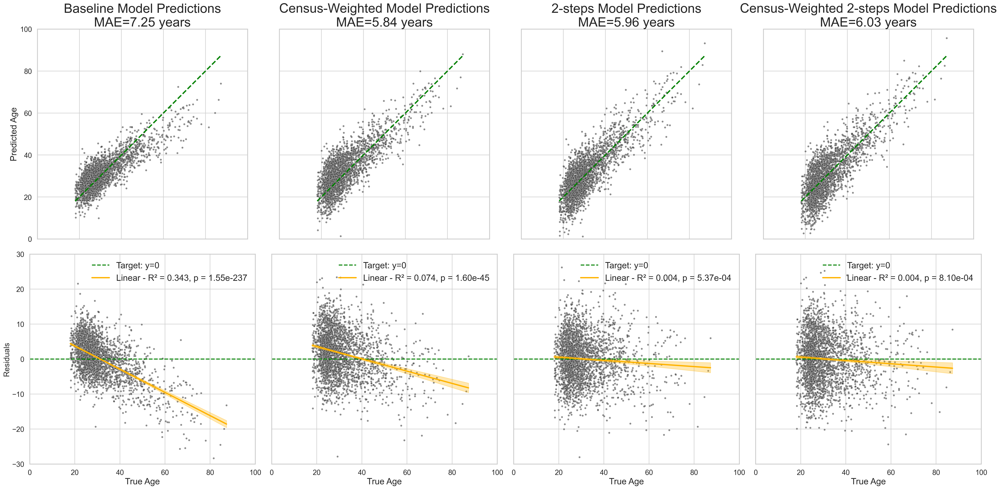

In [ ]:
# plot actual vs predicted for all of the models
# plot residuals vs age for all of the models
from statsmodels.formula.api import ols
import statsmodels.api as sm

keys_vis = {
    "baseline": "Baseline Model",
    "weighted": "Census-Weighted Model",
    "linear_ph": "2-steps Model",
    "quadratic_ph": "Quadratic Post-hoc",
    "combined": "Census-Weighted 2-steps Model",
}

title_fontsize = 30
rest_fontsize = 20

val_metric = "MAE_weighted"

nmodels = len(weighting_predictions)
fig, axes = plt.subplots(2, nmodels, figsize=(8 * nmodels, 16), sharey=False, sharex=True)
for i, (key, df) in enumerate(weighting_predictions.items()):
    ax = axes[0, i]
    sns.scatterplot(data=df, x="True", y="Predicted", ax=ax, s=20, color=COL_REF, alpha=0.6)
    ax.set_title(
        f"{keys_vis[key]} Predictions\nMAE={weighting_df.loc[key, val_metric]:.2f} years",
        fontsize=title_fontsize,
    )
    ax.set_aspect("equal")
    ax.set_xlabel("")
    ax.plot(
        [df["True"].min(), df["True"].max()],
        [df["True"].min(), df["True"].max()],
        color="green",
        linestyle="--",
        lw=3,
    )
    ax.set_xlim(0, 100)
    ax.set_ylim(0, 100)
    if i == 0:
        ax.set_ylabel("Predicted Age", fontsize=rest_fontsize)
    else:
        ax.set_ylabel("")
        # remove y-axis tick labels
        ax.set_yticklabels([])


for i, (key, df) in enumerate(weighting_predictions.items()):
    ax = axes[1, i]
    if "ph" in key:
        y_col = "corrected_residuals"
    else:
        df["raw_residuals"] = df["Predicted"] - df["True"]
        y_col = "raw_residuals"
    df = df.rename(columns={"True": "age_at_scan"})
    sns.scatterplot(data=df, x="age_at_scan", y=y_col, ax=ax, s=20, color=COL_REF, alpha=0.6)

    # estimate linear and quadratic fit between residuals and age
    lin_m = ols(f"{y_col} ~ age_at_scan", data=df).fit()
    poly_m = ols(f"{y_col} ~ age_at_scan + I(age_at_scan ** 2)", data=df).fit()
    r, p = pearsonr(df["age_at_scan"], df[y_col])
    p_vis = f"{p:.2e}" if p < 0.001 else f"{p:.3f}"
    # draw the "target": y = 0 line
    ax.axhline(0, color="green", linestyle="--", label="Target: y=0")
    # plot the linear fit
    x_vals = np.linspace(df["age_at_scan"].min(), df["age_at_scan"].max(), 300)
    x_frame = pd.DataFrame({"age_at_scan": x_vals})
    # find the p-value for the linear fit
    p_value = lin_m.f_pvalue
    # For visualisation, find the p < {something} value
    # p_vis = f"{p_value:.2e}" if p_value < 0.001 else f"{p_value:.3f}"
    lin_label = f"Linear - R² = {lin_m.rsquared_adj:.3f}, p = {p_vis}"
    # lin_label = f"$r$ = {r:.3f}, p = {p_vis}"
    # get predictions with CI
    lin_predictions = lin_m.get_prediction(x_frame)
    lin_predictions = lin_predictions.summary_frame(alpha=0.05)
    # plot the linear fit with confidence intervals
    ax.plot(x_vals, lin_m.predict(x_frame), color=COL_RAW, label=lin_label, lw=3)
    ax.fill_between(
        x_vals,
        lin_predictions["mean_ci_lower"],
        lin_predictions["mean_ci_upper"],
        color=COL_RAW,
        alpha=0.3,
    )
    # plot the quadratic fit
    # poly_label = f"Quadratic - R² = {poly_m.rsquared:.2f}, AIC = {poly_m.aic:.1f}"
    # get predictions with CI
    # poly_predictions = poly_m.get_prediction(x_frame)
    # poly_predictions = poly_predictions.summary_frame(alpha=0.05)
    # plot the quadratic fit with confidence intervals
    # ax.plot(
    #     x_vals, poly_m.predict(x_frame), color=COL_WEIGHTED, label=poly_label, lw=3
    # )
    # ax.fill_between(
    #     x_vals,
    #     poly_predictions["mean_ci_lower"],
    #     poly_predictions["mean_ci_upper"],
    #     color=COL_WEIGHTED, alpha=0.3
    # )
    # ax.set_title(f"{keys_vis[key]} Residuals\nMAE={weighting_df.loc[key, 'MAE_weighted']:.2f} years")
    ax.legend(frameon=False, loc="upper right", fontsize=rest_fontsize)

    ax.set_xlabel("True Age", fontsize=rest_fontsize)
    if i == 0:
        ax.set_ylabel("Residuals")
    else:
        ax.set_ylabel("")
        # remove y-axis tick labels
        ax.set_yticklabels([])
    ax.set_ylim(-30, 30)

    # ax.set_xlim(df["age_at_scan"].min(), df["age_at_scan"].max())
    # ax.legend(frameon=False)
plt.tight_layout()
savefig_nice(
    fig,
    OUTPUT_DIR / f"fig3_weighted_predictions_{metric}.png",
    tight=True,
    dpi=300,
)
# savefig_nice(
#     fig,
#     OUTPUT_DIR / "global_efficiency.png",
#     tight=True,
#     dpi=300,
# )

In [ ]:
vis_predictions = {
    k: v for k, v in weighting_predictions.items() if k in ["baseline", "linear_ph"]
}
# weighting_predictions.keys()

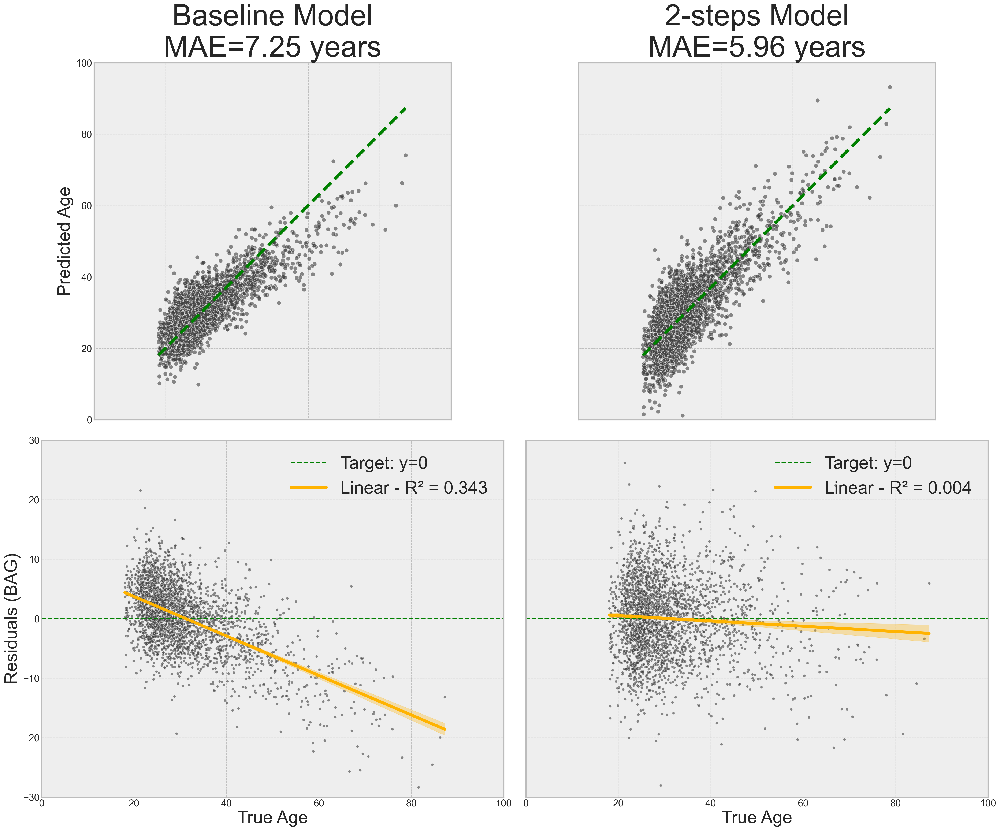

In [ ]:
# plot actual vs predicted for all of the models
# plot residuals vs age for all of the models
from statsmodels.formula.api import ols
import statsmodels.api as sm

keys_vis = {
    "baseline": "Baseline Model",
    "weighted": "Census-Weighted Model",
    "linear_ph": "2-steps Model",
    "quadratic_ph": "Quadratic Post-hoc",
    "combined": "Census-Weighted 2-steps Model",
}

title_fontsize = 50
rest_fontsize = 30

nmodels = len(vis_predictions)
fig, axes = plt.subplots(2, nmodels, figsize=(12 * nmodels, 20), sharey=False, sharex=True)
for i, (key, df) in enumerate(vis_predictions.items()):
    ax = axes[0, i]
    sns.scatterplot(data=df, x="True", y="Predicted", ax=ax, s=50, color=COL_REF, alpha=0.6)
    ax.set_title(
        f"{keys_vis[key]}\nMAE={weighting_df.loc[key, val_metric]:.2f} years",
        fontsize=title_fontsize,
    )
    ax.set_aspect("equal")
    ax.set_xlabel("")
    ax.plot(
        [df["True"].min(), df["True"].max()],
        [df["True"].min(), df["True"].max()],
        color="green",
        linestyle="--",
        lw=5,
    )
    ax.set_xlim(0, 100)
    ax.set_ylim(0, 100)
    if i == 0:
        ax.set_ylabel("Predicted Age", fontsize=rest_fontsize)
    else:
        ax.set_ylabel("")
        # remove y-axis tick labels
        ax.set_yticklabels([])


for i, (key, df) in enumerate(vis_predictions.items()):
    ax = axes[1, i]
    if "ph" in key:
        y_col = "corrected_residuals"
    else:
        df["raw_residuals"] = df["Predicted"] - df["True"]
        y_col = "raw_residuals"
    df = df.rename(columns={"True": "age_at_scan"})
    sns.scatterplot(data=df, x="age_at_scan", y=y_col, ax=ax, s=20, color=COL_REF, alpha=0.6)

    # estimate linear and quadratic fit between residuals and age
    lin_m = ols(f"{y_col} ~ age_at_scan", data=df).fit()
    poly_m = ols(f"{y_col} ~ age_at_scan + I(age_at_scan ** 2)", data=df).fit()
    # draw the "target": y = 0 line
    ax.axhline(0, color="green", linestyle="--", label="Target: y=0")
    # plot the linear fit
    x_vals = np.linspace(df["age_at_scan"].min(), df["age_at_scan"].max(), 300)
    x_frame = pd.DataFrame({"age_at_scan": x_vals})
    # find the p-value for the linear fit
    p_value = lin_m.f_pvalue
    # For visualisation, find the p < {something} value
    p_vis = f"{p_value:.2e}" if p_value < 0.001 else f"{p_value:.3f}"
    r, p = pearsonr(df["age_at_scan"], df[y_col])
    # lin_label = f"Linear - R² = {lin_m.rsquared_adj:.3f}, p = {p_vis}"
    lin_label = f"Linear - R² = {lin_m.rsquared_adj:.3f}"
    # lin_label = f"$r$ = {r**2:.3f}, p = {p_vis}"
    # get predictions with CI
    lin_predictions = lin_m.get_prediction(x_frame)
    lin_predictions = lin_predictions.summary_frame(alpha=0.05)
    # plot the linear fit with confidence intervals
    ax.plot(x_vals, lin_m.predict(x_frame), color=COL_RAW, label=lin_label, lw=5)
    ax.fill_between(
        x_vals,
        lin_predictions["mean_ci_lower"],
        lin_predictions["mean_ci_upper"],
        color=COL_RAW,
        alpha=0.3,
    )
    # plot the quadratic fit
    # poly_label = f"Quadratic - R² = {poly_m.rsquared:.2f}, AIC = {poly_m.aic:.1f}"
    # get predictions with CI
    # poly_predictions = poly_m.get_prediction(x_frame)
    # poly_predictions = poly_predictions.summary_frame(alpha=0.05)
    # plot the quadratic fit with confidence intervals
    # ax.plot(
    #     x_vals, poly_m.predict(x_frame), color=COL_WEIGHTED, label=poly_label, lw=3
    # )
    # ax.fill_between(
    #     x_vals,
    #     poly_predictions["mean_ci_lower"],
    #     poly_predictions["mean_ci_upper"],
    #     color=COL_WEIGHTED, alpha=0.3
    # )
    # ax.set_title(f"{keys_vis[key]} Residuals\nMAE={weighting_df.loc[key, 'MAE_weighted']:.2f} years")
    ax.legend(frameon=False, loc="upper right", fontsize=rest_fontsize)

    ax.set_xlabel("True Age", fontsize=rest_fontsize)
    if i == 0:
        ax.set_ylabel("Residuals (BAG)", fontsize=rest_fontsize)
    else:
        ax.set_ylabel("")
        # remove y-axis tick labels
        ax.set_yticklabels([])
    ax.set_ylim(-30, 30)

    # ax.set_xlim(df["age_at_scan"].min(), df["age_at_scan"].max())
    # ax.legend(frameon=False)
plt.tight_layout()
savefig_nice(
    fig,
    OUTPUT_DIR / f"fig3_weighted_predictions_{metric}.png",
    tight=True,
    dpi=300,
)
# savefig_nice(
#     fig,
#     OUTPUT_DIR / "global_efficiency.png",
#     tight=True,
#     dpi=300,
# )

In [ ]:
import numpy as np, pandas as pd
from sklearn.linear_model import RidgeCV, ElasticNetCV
from sklearn.model_selection import KFold, cross_val_predict
from sklearn.metrics import r2_score, mean_absolute_error, root_mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

perf_rows = []

use_weights = False
# do_post_hoc_correction = True
post_hoc_degree = 1
apply_correction = True

predictions = {}

for metric, X in X_dict.items():
    # Optionally concatenate covariates
    covariates = cov_names[metric]
    if cov_names:
        X_model = np.hstack([X, cov[covariates].to_numpy()])
    else:
        X_model = X
    # y_pred = stratified_regression_cv(X_model, y, w, n_splits=10, n_bins=10)
    # cur_estimator = BiasCorrectedRegressor(
    #     base_estimator=estimator,
    #     apply_correction=apply_correction,
    #     scorer="neg_mean_absolute_error",
    #     # use_weights=use_weights,
    #     # cv=outer_cv
    # )

    grid = GridSearchCV(
        pipeline,
        param_grid=param_grid,
        cv=5,
        scoring="neg_mean_absolute_error",
        n_jobs=4,
        refit=True,
        verbose=1
    )
    # Fit the model
    grid.fit(X_model, y, estimator__sample_weight=w if use_weights else None)
    model = grid.best_estimator_

    # model = RidgeCV(alphas=alphas, scoring="neg_mean_absolute_error")

    # model.fit(X_model, y, estimator__sample_weight=w if use_weights else None)
    # y_pred = model.predict(X_model, **{"y_chron": y} if apply_correction else {})
    # y_pred = cross_val_predict(estimator=model, X=X_model, y=y, cv=outer_cv, params={"estimator__sample_weight": w if use_weights else None})
    # y_pred_raw, y_pred = cross_val_predict_with_bias_correction(
    #     estimator=model,
    #     X=X_model,
    #     y=y,
    #     sample_weight=w if use_weights else None,
    #     cv=outer_cv,
    #     correction_method="spline",
    # )
    y_pred, _, corrected_residuals = cross_val_predict_with_bias_correction(
        model=model,
        X=X_model,
        y_chronological=y,
        w=w,
        cv=outer_cv,
        use_weights=use_weights,
        method="cole" if apply_correction else "none",
        # residual_orthog_degree=post_hoc_degree,
    )
    # y_pred = manual_cross_val_predict(
    #     model=model,
    #     X=X_model,
    #     y=y,
    #     cv=outer_cv,
    #     sample_weight=w if use_weights else None,
    #     apply_correction=apply_correction,
    # )
    residuals = y_pred - y
    predictions_df = cov.copy()
    predictions_df["True"] = y
    predictions_df["Predicted"] = y_pred
    # predictions_df["raw_residuals"] = original_residuals
    predictions_df["corrected_residuals"] = residuals
    predictions[metric] = predictions_df
    perf_rows.append(
        dict(
            metric=metric,
            model=model,
            # R2=r2_score(y, y_pred, sample_weight=w if use_weights else None),
            # MAE=mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None),
            # RMSE=root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None),
            R2=r2_score(y, y_pred),
            R2_weighted=r2_score(y, y_pred, sample_weight=w),
            MAE=mean_absolute_error(y, y_pred),
            MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
            RMSE=root_mean_squared_error(y, y_pred),
            RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
        )
    )
    # y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
    #     model=model,
    #     X=X_model,
    #     y_chronological=y,
    #     w=w,
    #     cv=outer_cv,
    #     use_weights=use_weights,
    #     post_hoc_degree=post_hoc_degree,
    #     # residual_orthog_degree=post_hoc_degree,
    # )

    # y_pred = cross_val_predict(
    #     model,
    #     X_model,
    #     y,
    #     # groups=age_strata(y),
    #     cv=outer_cv,
    #     params={"estimator__sample_weight": w if use_weights else None},
    #     n_jobs=-1,
    # )
    # if do_post_hoc_correction:
    #     resid = y - y_pred
    #     z = np.polyfit(y, resid, 2)
    #     p = np.poly1d(z)
    #     y_pred = y_pred + p(y)
    # # Save predictions

    # break

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits


5.587747629219239
0.4846413969901142


(0.0, 100.0)

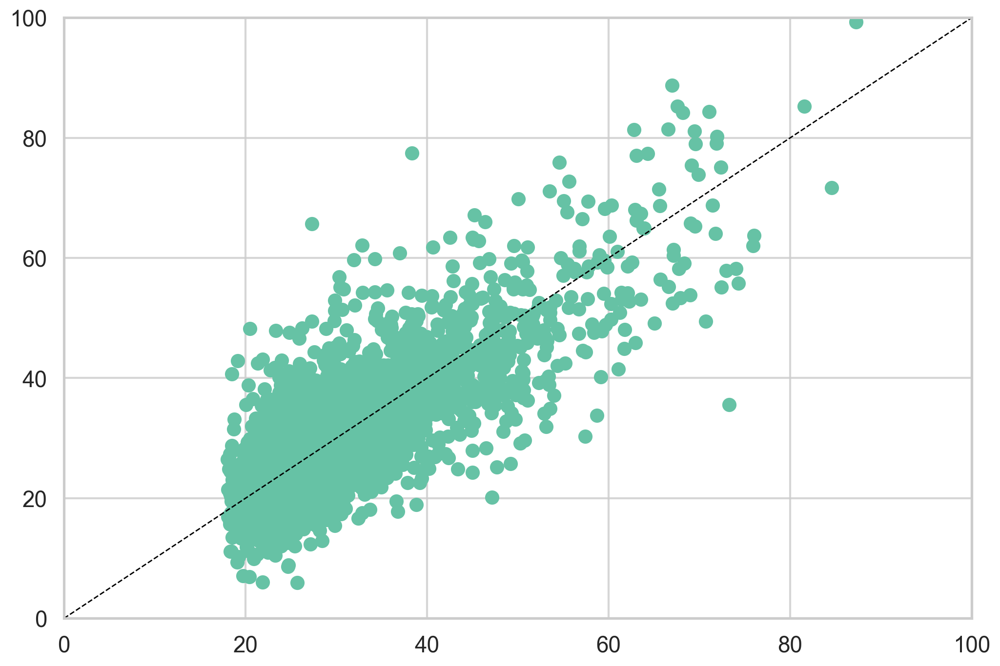

In [ ]:
print(mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None))
print(r2_score(y, y_pred, sample_weight=w if use_weights else None))
plt.scatter(y, y_pred)
plt.plot([0, 100], [0, 100], color="black", linestyle="--", linewidth=1)
plt.xlim(0, 100)
plt.ylim(0, 100)

In [ ]:
from scipy.stats import spearmanr

spearmanr(predictions["gm_vol"]["True"], predictions["gm_vol"]["corrected_residuals"])

SignificanceResult(statistic=-0.032618988026981564, pvalue=0.0974953152746237)

In [ ]:
pd.DataFrame(perf_rows).set_index("metric").sort_values("MAE_weighted", ascending=True)

,model,R2,R2_weighted,MAE,MAE_weighted,RMSE,RMSE_weighted
metric,,,,,,,
gm_vol,"(RobustScaler(), Lasso(alpha=0.048939009184774...",0.573207,0.839454,5.287274,5.958554,6.649346,7.485046
wm_vol,"(RobustScaler(), Lasso(alpha=0.048939009184774...",0.429772,0.803911,6.135242,6.668766,7.685900,8.272210
ad,"(RobustScaler(), Lasso(alpha=0.085316785241728...",0.492594,0.775336,5.513849,6.834677,7.250175,8.854464
fa,"(RobustScaler(), Lasso(alpha=0.085316785241728...",0.529524,0.695954,5.290847,7.045959,6.981346,10.300661
adc,"(RobustScaler(), Lasso(alpha=0.048939009184774...",0.480172,0.732797,5.582826,7.386225,7.338385,9.656412
csf_vol,"(RobustScaler(), Lasso(alpha=0.048939009184774...",0.456463,0.729126,5.740196,7.410317,7.503863,9.722530
rd,"(RobustScaler(), Lasso(alpha=0.048939009184774...",0.484641,0.728289,5.587748,7.410943,7.306767,9.737530


In [ ]:
# ### ----------- Concatenate all metrics into one model ----------- ###
# from sklearn.pipeline import make_pipeline

# X_concat = np.hstack([X_dict[m] for m in metrics])  # already row-aligned
# # add covariates
# covariates = pd.concat([cov[cov_names[m]] for m in metrics], axis=1)
# # drop duplicate columns
# covariates = covariates.loc[:, ~covariates.columns.duplicated()].to_numpy()
# X_concat = np.hstack([X_concat, covariates])

# pipe = Pipeline(
#     [
#         ("scaler", scaler),
#         ("estimator", estimator),
#     ]
# )
# y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
#     model=pipe,
#     X=X_concat,
#     y_chronological=y,
#     w=w,
#     cv=outer_cv,
#     use_weights=use_weights,
#     post_hoc_degree=post_hoc_degree,
#     # residual_orthog_degree=post_hoc_degree,
# )

# # if do_post_hoc_correction:
# #     resid = y - y_pred
# #     z = np.polyfit(y, resid, 2)
# #     p = np.poly1d(z)
# #     y_pred = y_pred + p(y)
# # # Save predictions
# predictions_df = cov.copy()
# predictions_df["True"] = y
# predictions_df["Predicted"] = y_pred
# predictions_df["raw_residuals"] = original_residuals
# predictions_df["corrected_residuals"] = corrected_residuals
# predictions["concatenated"] = predictions_df
# perf_rows.append(
#     dict(
#         metric="concatenated",
#         R2=r2_score(y, y_pred),
#         R2_weighted=r2_score(y, y_pred, sample_weight=w),
#         MAE=mean_absolute_error(y, y_pred),
#         MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
#         RMSE=root_mean_squared_error(y, y_pred),
#         RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
#     )
# )

In [ ]:
# polynomial features
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
from tqdm import tqdm

# ---------------------------------------------------------------------
# 2. Parcel-wise base-learner loop
# ---------------------------------------------------------------------
stacked_models = parcels.copy()

stacked_estimators = {}
predictions["base_stacked"] = {}

alphas = np.logspace(-3, 4, 30)  # ridge grid
for i, row in tqdm(parcels.iterrows(), total=parcels.shape[0], desc="Fitting models"):  # i == parcel index (0..453)
    # ------------- build design matrix for parcel i -----------------
    # X_roi : (n_subjects , 5 metrics)
    # X_cov = cov[cov_names["gm_vol"]].to_numpy()
    X_roi = np.hstack([X_dict[m][:, [i]] for m in metrics])
    # X_roi = np.hstack([X_roi, X_cov])  # add covariates
    # cur_estimator = BiasCorrectedRegressor(
    #     base_estimator=estimator,
    #     apply_correction=False,
    #     scorer="neg_mean_absolute_error",
    #     # apply_correction=False,
    #     # use_weights=use_weights,
    #     # cv=outer_cv
    # )
    grid = GridSearchCV(
        pipeline,
        param_grid=param_grid,
        cv=5,
        scoring="neg_mean_absolute_error",
        n_jobs=4,
        refit=True,
        verbose=0
    )
    # Fit the model
    grid.fit(X_roi, y, estimator__sample_weight=w if use_weights else None)
    model = grid.best_estimator_

    # model = RidgeCV(alphas=alphas, scoring="neg_mean_absolute_error")

    # model.fit(X_model, y, estimator__sample_weight=w if use_weights else None)
    # y_pred = model.predict(X_model, **{"y_chron": y} if apply_correction else {})
    # y_pred = cross_val_predict(estimator=model, X=X_model, y=y, cv=outer_cv, params={"estimator__sample_weight": w if use_weights else None})
    # y_pred_raw, y_pred = cross_val_predict_with_bias_correction(
    #     estimator=model,
    #     X=X_model,
    #     y=y,
    #     sample_weight=w if use_weights else None,
    #     cv=outer_cv,
    #     correction_method="spline",
    # )
    y_pred, _, corrected_residuals = cross_val_predict_with_bias_correction(
        model=model,
        X=X_roi,
        y_chronological=y,
        w=w,
        cv=outer_cv,
        use_weights=use_weights,
        method="cole" if apply_correction else "none",
        # residual_orthog_degree=post_hoc_degree,
    )
    # y_pred = manual_cross_val_predict(
    #     model=pipe,
    #     X=X_roi,
    #     y=y,
    #     cv=outer_cv,
    #     sample_weight=w if use_weights else None,
    #     # apply_correction=apply_correction,
    #     apply_correction=False,
    # )
    # y_pred = pipe.predict(X_roi, **{"y_chron": y} if apply_correction else {})
    residuals = y_pred - y
    # ---------------- fit model & predict --------------------------
    # y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
    #     model=pipe,
    #     X=X_roi,
    #     y_chronological=y,
    #     w=w,
    #     cv=outer_cv,
    #     use_weights=use_weights,
    #     post_hoc_degree=0,
    #     # residual_orthog_degree=post_hoc_degree,
    # )

    # ---------------- store predictions & metrics -------------------
    pred_df = cov.copy()
    pred_df["True"] = y
    pred_df["Predicted"] = y_pred
    # pred_df["raw_residuals"] = original_residuals
    pred_df["corrected_residuals"] = residuals
    predictions["base_stacked"][i] = pred_df
    r2 = r2_score(y, y_pred)
    mae = mean_absolute_error(y, y_pred)
    rmse = root_mean_squared_error(y, y_pred)
    r2_weighted = r2_score(y, y_pred, sample_weight=w)
    mae_weighted = mean_absolute_error(y, y_pred, sample_weight=w)
    rmse_weighted = root_mean_squared_error(y, y_pred, sample_weight=w)

    stacked_models.loc[
        i, ["R2", "MAE", "RMSE", "R2_weighted", "MAE_weighted", "RMSE_weighted"]
    ] = [r2, mae, rmse, r2_weighted, mae_weighted, rmse_weighted]
    stacked_estimators[i] = model
    # if i == 428:
    #     break

Fitting models:   0%|          | 0/454 [00:00<?, ?it/s]

Fitting models: 100%|██████████| 454/454 [09:11<00:00,  1.21s/it]


<Axes: >

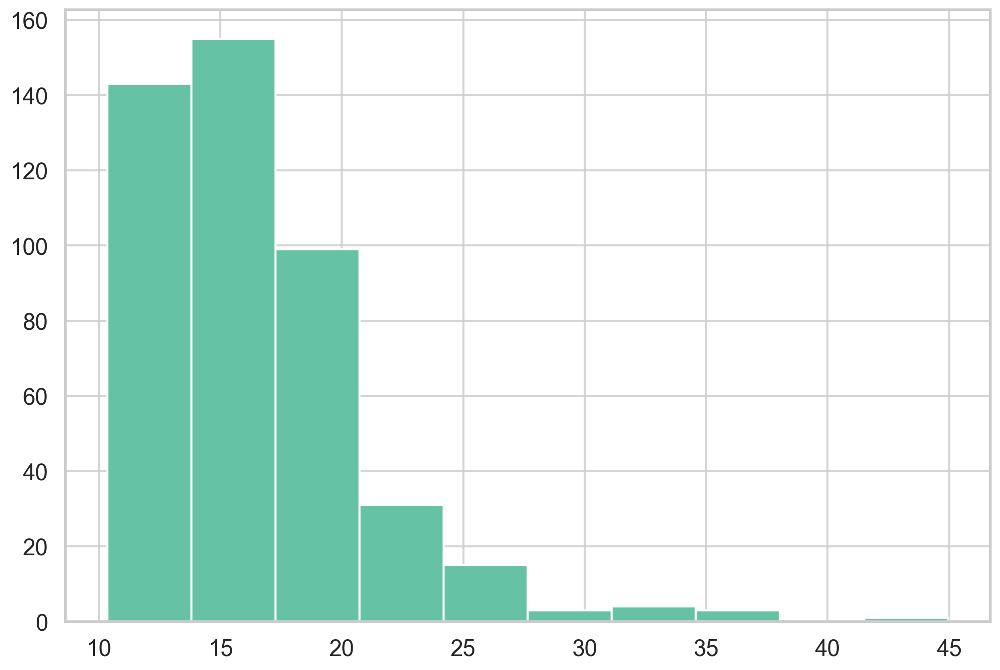

In [ ]:
stacked_models["MAE_weighted"].hist()
# plt.scatter(y,y_pred)
# stacked_models.sort_values("MAE_weighted", ascending=True)

In [ ]:
stacked_models.sort_values("MAE_weighted", ascending=True)

,index,name,base_name,Label Name,network,component,hemisphere,R2,MAE,RMSE,R2_weighted,MAE_weighted,RMSE_weighted
311,312,7Networks_RH_SalVentAttn_Med_2,7networks_rh_salventattn_med,7Networks_RH_SalVentAttn_Med,salience / ventral attention,medial,R,-0.546637,10.079780,12.657987,0.515952,10.348183,12.996887
331,332,7Networks_RH_Cont_Par_1,7networks_rh_cont_par,7Networks_RH_Cont_Par,control,parietal,R,-0.500576,9.816206,12.468076,0.517563,10.352691,12.975241
351,352,7Networks_RH_Cont_PFCl_12,7networks_rh_cont_pfcl,7Networks_RH_Cont_PFCl,control,lateral prefrontal cortex,R,-0.646526,10.239166,13.060350,0.485088,10.538324,13.404847
174,175,7Networks_LH_Default_PFC_10,7networks_lh_default_pfc,7Networks_LH_Default_PFC,default,prefrontal cortex,L,-0.671162,10.404741,13.157693,0.488635,10.553402,13.358592
310,311,7Networks_RH_SalVentAttn_Med_1,7networks_rh_salventattn_med,7Networks_RH_SalVentAttn_Med,salience / ventral attention,medial,R,-0.505313,9.703800,12.487741,0.470039,10.591253,13.599321
...,...,...,...,...,...,...,...,...,...,...,...,...,...
401,402,HIP-head-m2-rh,HIP-head-m2,"Hippocampus head, medial division",subcortex,Hippocampus head,R,-12.727583,27.742441,37.710956,-7.044152,34.310485,52.982868
125,126,7Networks_LH_Limbic_TempPole_8,7networks_lh_limbic_temppole,7Networks_LH_Limbic_TempPole,limbic,temporal pole,L,-15.153374,32.324238,40.907423,-4.745867,35.486647,44.778871
432,433,HIP-body-lh,HIP-body,Hippocampus body,subcortex,Hippocampus body,L,-11.304035,23.416605,35.702143,-13.986127,37.141934,72.316942
425,426,pGP-rh,pGP,"Pallidum, posterior part",subcortex,Pallidum,R,-21.036197,37.468723,47.779195,-5.743624,37.645423,48.511200


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeCV
from sklearn.metrics import (
    r2_score,
    mean_absolute_error,
    mean_squared_error,
)

# ------------------------------------------------------------------
# 1.  Build the meta-feature matrix  (n_subj × n_parcels [+ covariates])
# ------------------------------------------------------------------
# stack parcel OOF columns → shape (454, n_subj) → transpose
X_cov = cov[cov_names["gm_vol"]].to_numpy()
X_stacked = np.vstack(
    [predictions["base_stacked"][i]["Predicted"].to_numpy() for i in predictions["base_stacked"]]
).T  # (n_subj, n_parcels)

# Optionally add covariates (e.g., sex, TIV)
X_stacked = np.hstack([X_stacked, X_cov])  # (n_subj, n_parcels + n_covariates)

# ------------------------------------------------------------------
# 2.  Meta-learner pipeline (standardised ridge with CV on λ)
# ------------------------------------------------------------------
# cur_estimator = BiasCorrectedRegressor(
#     base_estimator=estimator,
#     apply_correction=apply_correction,
#     scorer="neg_mean_absolute_error",
#     # use_weights=use_weights,
#     # cv=outer_cv
# )
grid = GridSearchCV(
        pipeline,
        param_grid=param_grid,
        cv=5,
        scoring="neg_mean_absolute_error",
        n_jobs=4,
        refit=True,
        verbose=1
    )
    # Fit the model
grid.fit(X_stacked, y, estimator__sample_weight=w if use_weights else None)
model = grid.best_estimator_

# model = RidgeCV(alphas=alphas, scoring="neg_mean_absolute_error")

# model.fit(X_model, y, estimator__sample_weight=w if use_weights else None)
# y_pred = model.predict(X_model, **{"y_chron": y} if apply_correction else {})
# y_pred = cross_val_predict(estimator=model, X=X_model, y=y, cv=outer_cv, params={"estimator__sample_weight": w if use_weights else None})
# y_pred_raw, y_pred = cross_val_predict_with_bias_correction(
#     estimator=model,
#     X=X_model,
#     y=y,
#     sample_weight=w if use_weights else None,
#     cv=outer_cv,
#     correction_method="spline",
# )
y_pred, _, corrected_residuals = cross_val_predict_with_bias_correction(
    model=model,
    X=X_stacked,
    y_chronological=y,
    w=w,
    cv=outer_cv,
    use_weights=use_weights,
    method="cole" if apply_correction else "none",
    # residual_orthog_degree=post_hoc_degree,
)
# y_pred = cross_val_predict_corrected(
#     model=pipe,
#     X=X_stacked,
#     y=y,
#     cv=outer_cv,
#     sample_weight=w if use_weights else None,
#     # apply_correction=apply_correction,
# )
# y_pred = manual_cross_val_predict(
#     model=pipe,
#     X=X_stacked,
#     y=y,
#     cv=outer_cv,
#     sample_weight=w if use_weights else None,
#     apply_correction=apply_correction,
# )
residuals = y_pred - y
# ------------------------------------------------------------------
# 3.  Out-of-fold meta predictions with fold-wise bias correction
# ------------------------------------------------------------------
# y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
#     model=pipe,
#     X=X_stacked,
#     y_chronological=y,
#     w=w,
#     cv=outer_cv,
#     use_weights=use_weights,
#     post_hoc_degree=post_hoc_degree,
#     # residual_orthog_degree=post_hoc_degree,
# )

# ------------------------------------------------------------------
# 4.  Store predictions and performance
# ------------------------------------------------------------------
pred_df = cov.copy()
pred_df["True"] = y
pred_df["Predicted"] = y_pred
# pred_df["raw_residuals"] = original_residuals
pred_df["corrected_residuals"] = residuals
predictions["stacked"] = pred_df


perf_rows.append(
    dict(
        metric="stacked",
        model=model,
        R2=r2_score(y, y_pred),
        R2_weighted=r2_score(y, y_pred, sample_weight=w),
        MAE=mean_absolute_error(y, y_pred),
        MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
        RMSE=root_mean_squared_error(y, y_pred),
        RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
    )
)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


In [ ]:
m = "MAE"
perf_df = pd.DataFrame(perf_rows).set_index("metric").sort_values(m, ascending=True)

In [ ]:
perf_df["is_best"] = perf_df[m] == perf_df[m].min()
# set is_best == False to gray and True to green (use RGB colors)
perf_df["color"] = perf_df["is_best"].map({True: "green", False: "gray"})

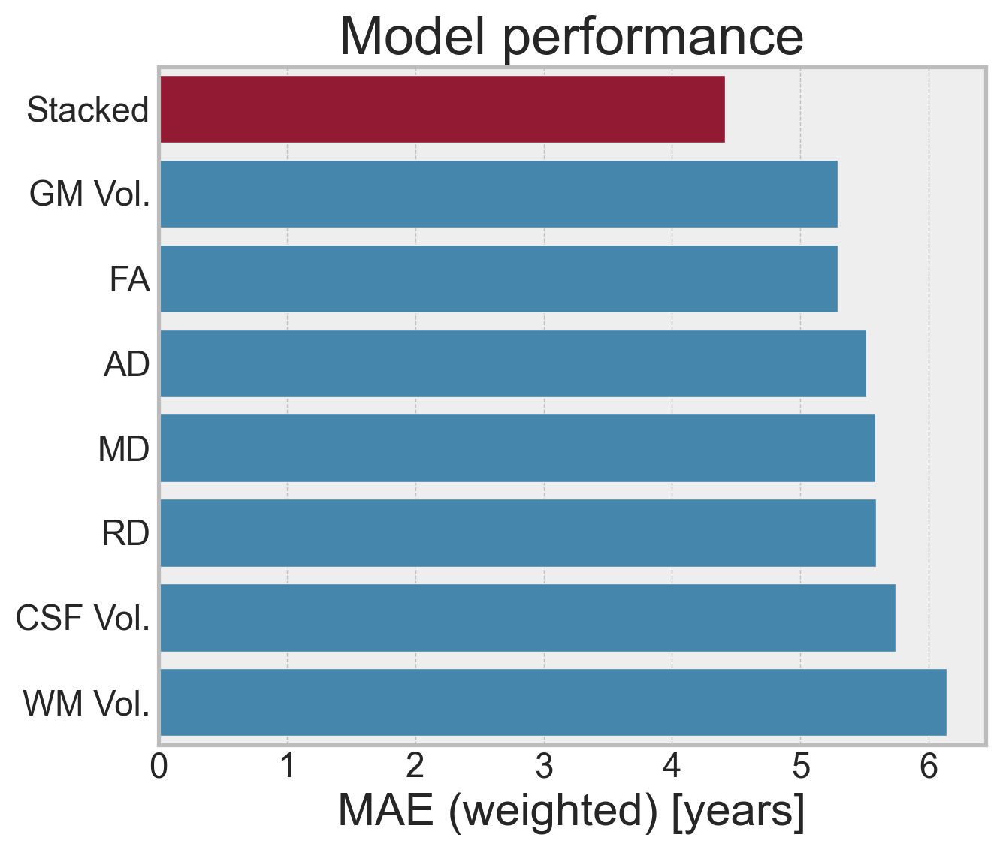

In [ ]:
# -----------------------------------------------------------
# 2.  barplot with 95 % BCa bootstrap CIs on R²
# -----------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.utils import resample

ticks_mapping = {
    "gm_vol": "GM Vol.",
    "wm_vol": "WM Vol.",
    "csf_vol": "CSF Vol.",
    "rd": "RD",
    "fa": "FA",
    "ad": "AD",
    "adc": "MD",
    "stacked": "Stacked",
}

fig, ax = plt.subplots(figsize=(7, 6))
sns.barplot(
    y="metric", x=m, data=perf_df.reset_index(), ax=ax, orient="h", hue="is_best", legend=False
)
# ax.errorbar(
#     x=np.arange(len(perf_df)),
#     y=perf_df["RMSE"],
#     # yerr=[perf_df["R2"] - ci_lo, ci_hi - perf_df["R2"]],
#     fmt="none",

#     capsize=4,
#     color="k",
#     lw=1,
# )
# change the y-ticks to the metric names
ax.set_yticks(np.arange(len(perf_df)))
ax.set_yticklabels([ticks_mapping.get(m, m) for m in perf_df.index])
# ax.set_ylabel("$R^{2}$  (10× CV, bias-corrected)")
ax.set_xlabel("MAE (weighted) [years]")
ax.set_ylabel("")
ax.set_title("Model performance")
# ax.set_xticks(np.arange(0, 1.1, 0.1))
# ax.set_ylim(0.8, perf_df["R2"].max() * 1.15)
plt.tight_layout()
# ax.set_xlim(3,6)
savefig_nice(
    fig,
    OUTPUT_DIR / "model_performance.png",
    tight=True,
    dpi=300,
)
# plt.show()


In [ ]:
best_metric = perf_df.index[0]
# best_metric = "stacked"
y = predictions[best_metric]["True"].to_numpy()
y_pred = predictions[best_metric]["Predicted"].to_numpy()
# w = predictions[best_metric]["weight"].to_numpy()
df_vis = (
    predictions[best_metric][["True", "Predicted"]]
    .copy()
    .rename(columns={"True": "age", "Predicted": "predicted"})
)

df_vis["residuals"] = df_vis["predicted"] - df_vis["age"]
# # build a model to predict the residuals
# import statsmodels.api as sm
# from statsmodels.formula.api import ols
# import statsmodels.formula.api as smf

# # Fit a linear model to the residuals
# df["residuals"] = residuals
# model = ols("residuals ~ age", data=df).fit()
# # use the model to "fix" the predictions
# df["fixed_predicted"] = df["predicted"] + model.resid

/tmp/ipykernel_8005/3178380517.py:23: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(
/tmp/ipykernel_8005/3178380517.py:56: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


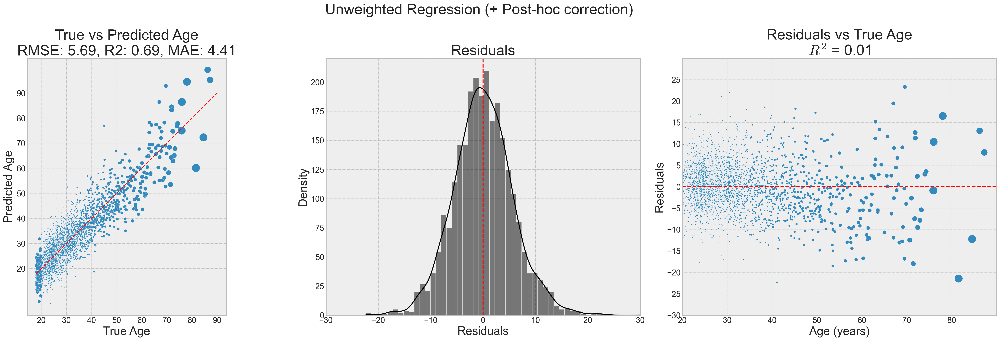

In [ ]:
import seaborn as sns
from scipy.stats import pearsonr, spearmanr

plt.style.use("bmh")

do_post_hoc_correction = True
use_weights = False

r2 = r2_score(y, y_pred, sample_weight=w if use_weights else None)
rmse = root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None)
mae = mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None)

# r2 = r2_score(y, y_pred)
# rmse = root_mean_squared_error(y, y_pred)
# mae = mean_absolute_error(y, y_pred)


title = f"True vs Predicted Age\nRMSE: {rmse:.2f}, R2: {r2:.2f}, MAE: {mae:.2f}"

fig, axes = plt.subplots(1, 3, figsize=(30, 10))
# plot true vs predicted
ax = axes[0]
sns.scatterplot(
    data=df_vis,
    x="age",
    y="predicted",
    ax=ax,
    # cmap="jet",
    # color by weight,
    # hue=w.flatten(),
    palette="viridis",
    s=w * 10,
)
ax.plot([18, 90], [18, 90], "--", c="red")
ax.set_xlabel("True Age", fontsize=24)
ax.set_ylabel("Predicted Age", fontsize=24)
ax.set_title(title, fontsize=30)
ax.set_xticks(range(20, 100, 10))
ax.set_yticks(range(20, 100, 10))
# make axis square
ax.set_aspect("equal", "box")

# plot residuals
ax = axes[1]
sns.histplot(data=df_vis, x="residuals", ax=ax, kde=True, color="black")
ax.set_xlabel("Residuals", fontsize=24)
ax.set_ylabel("Density", fontsize=24)
ax.set_title("Residuals", fontsize=30)
ax.axvline(0, color="red", linestyle="--")
ax.set_xlim(-30, 30)
# plot residuals vs true age

r, p = pearsonr(df_vis["age"], df_vis["residuals"])

ax = axes[2]
sns.scatterplot(
    data=df_vis,
    x="age",
    y="residuals",
    ax=ax,
    # cmap="jet",
    # color by weight,
    # hue=w.flatten(),
    palette="viridis",
    s=w * 10,
)
ax.axhline(0, color="red", linestyle="--")
ax.set_xlabel("Age (years)", fontsize=24)
ax.set_ylabel("Residuals", fontsize=24)
ax.set_title("Residuals vs True Age\n$R^2$ = {:.2f}".format(r**2), fontsize=30)
ax.set_xticks(range(20, 90, 10))
ax.set_yticks(range(-30, 30, 5))
ax.set_xlim(20, 90)
ax.set_ylim(-30, 30)
# make axis square

suptitle = "Weighted Regression" if use_weights else "Unweighted Regression"
if do_post_hoc_correction:
    suptitle += " (+ Post-hoc correction)"
fig.suptitle(suptitle, fontsize=30)

plt.tight_layout()

/tmp/ipykernel_8005/4031689567.py:24: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(
/tmp/ipykernel_8005/4031689567.py:57: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


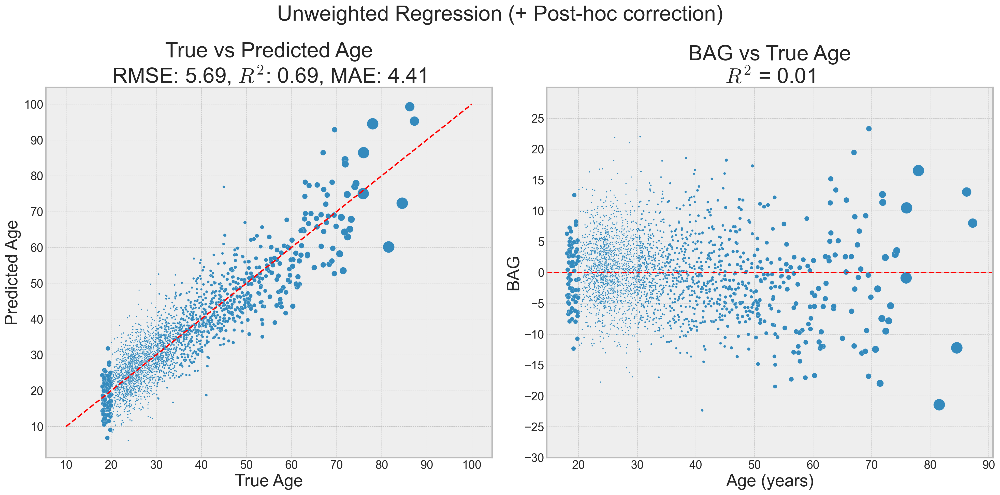

In [ ]:
import seaborn as sns
from scipy.stats import pearsonr, spearmanr

plt.style.use("bmh")

do_post_hoc_correction = True
use_weights = False

r2 = r2_score(y, y_pred, sample_weight=w if use_weights else None)
rmse = root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None)
mae = mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None)

# r2 = r2_score(y, y_pred)
# rmse = root_mean_squared_error(y, y_pred)
# mae = mean_absolute_error(y, y_pred)


# title = f"True vs Predicted Age\nRMSE: {rmse:.2f}, R2: {r2:.2f}, MAE: {mae:.2f}"
title = f"True vs Predicted Age\nRMSE: {rmse:.2f}, $R^2$: {r2:.2f}, MAE: {mae:.2f}"

fig, axes = plt.subplots(1, 2, figsize=(20, 10))
# plot true vs predicted
ax = axes[0]
sns.scatterplot(
    data=df_vis,
    x="age",
    y="predicted",
    ax=ax,
    # cmap="jet",
    # color by weight,
    # hue=w.flatten(),
    palette="viridis",
    s=w * 10,
)
ax.plot([10, 100], [10, 100], "--", c="red")
ax.set_xlabel("True Age", fontsize=24)
ax.set_ylabel("Predicted Age", fontsize=24)
ax.set_title(title, fontsize=30)
ax.set_xticks(range(10, 110, 10))
ax.set_yticks(range(10, 110, 10))
# make axis square
# ax.set_aspect("equal", "box")

# plot residuals
# ax = axes[1]
# sns.histplot(data=df, x="residuals", ax=ax, kde=True, color="black")
# ax.set_xlabel("Residuals", fontsize=24)
# ax.set_ylabel("Density", fontsize=24)
# ax.set_title("Residuals", fontsize=30)
# ax.axvline(0, color="red", linestyle="--")

# plot residuals vs true age

r, p = pearsonr(df_vis["age"], df_vis["residuals"])

ax = axes[1]
sns.scatterplot(
    data=df_vis,
    x="age",
    y="residuals",
    ax=ax,
    # cmap="jet",
    # color by weight,
    # hue=w.flatten(),
    palette="viridis",
    s=w * 10,
)
ax.axhline(0, color="red", linestyle="--")
ax.set_xlabel("Age (years)", fontsize=24)
ax.set_ylabel("BAG", fontsize=24)
ax.set_title("BAG vs True Age\n$R^2$ = {:.2f}".format(r**2), fontsize=30)
ax.set_xticks(range(20, 100, 10))
ax.set_yticks(range(-30, 30, 5))
ax.set_ylim(-30, 30)
# make axis square

suptitle = "Weighted Regression" if use_weights else "Unweighted Regression"
if do_post_hoc_correction:
    suptitle += " (+ Post-hoc correction)"
fig.suptitle(suptitle, fontsize=30)

plt.tight_layout()
savefig_nice(
    fig,
    OUTPUT_DIR / "true_vs_predicted_age.png",
    tight=True,
    dpi=300,
)

In [ ]:
import shap

# feature importance for the best model
best_model = perf_df.loc[best_metric, "model"]
best_model
X_inspect = best_model.named_steps["scaler"].transform(X_stacked)

# Use the trained estimator
explainer = shap.LinearExplainer(best_model.named_steps["estimator"], X_inspect)

# Explain on scaled test data
shap_values = explainer.shap_values(X_inspect)


In [ ]:
from sklearn.inspection import permutation_importance


# Calculate permutation importance
result = permutation_importance(estimator=best_model, X=X_stacked, y=y, scoring="neg_mean_squared_error")

In [ ]:
# shap.summary_plot(shap_values, X_inspect)
shap_imp = parcels.copy()
shap_imp["importance"] = shap_values.mean(axis=0)[:len(parcels)]
shap_imp["importance_abs"] = np.abs(shap_imp["importance"])
shap_imp["permutation_importance"] = result.importances_mean[:len(parcels)]
shap_imp["permutation_importance_std"] = result.importances_std[:len(parcels)]
shap_imp[shap_imp["permutation_importance"] < 0] = 0  # set negative importances to 0
# min-max scale the permutation importance
shap_imp["permutation_importance_scaled"] = (
    shap_imp["permutation_importance"]
    - shap_imp["permutation_importance"].min()
) / (
    shap_imp["permutation_importance"].max() - shap_imp["permutation_importance"].min()
)

# shap_imp.sort_values("importance", ascending=False)

In [ ]:
# shap_imp["permutation_importance"].hist(bins=30)
# shap_imp.iloc[400:].sort_values("permutation_importance", ascending=False)

In [ ]:
import numpy as np
import pandas as pd
import nibabel as nb
from nilearn import surface, datasets
from surfplot import Plot
from matplotlib.colors import TwoSlopeNorm  # nice diverging colours
from neuromaps.datasets import fetch_fslr
from brainspace.datasets import load_parcellation
import nibabel as nib


atlas_img = nib.load(nifti_matlab)

# ---------------------------------------------------------------------
# 2.  FETCH A STANDARD SURFACE  (fsaverage5 = 10k vertices per hemi)
# ---------------------------------------------------------------------
surfaces = fetch_fslr()
lh, rh = surfaces["veryinflated"]


# ---------------------------------------------------------------------
# 3.  SAMPLE ATLAS VOXELS → SURFACE  (nearest-neighbour so labels stay int)
# ---------------------------------------------------------------------
# add schaefer parcellation (no color bar needed)
lh_parc, rh_parc = load_parcellation("schaefer")

<Axes: >

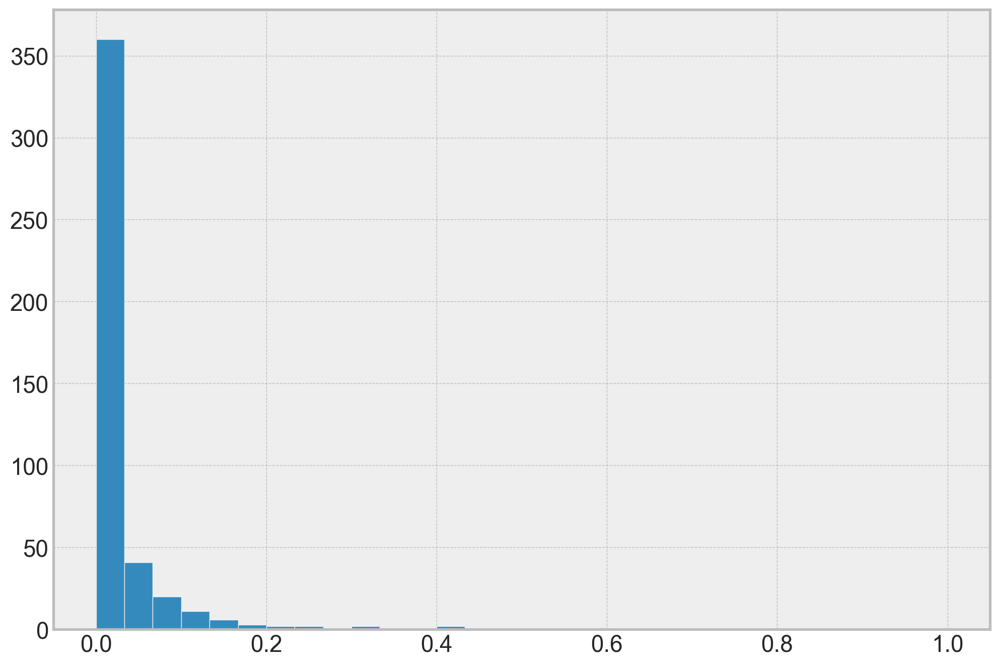

In [ ]:
shap_imp["permutation_importance_scaled"].hist(bins=30)

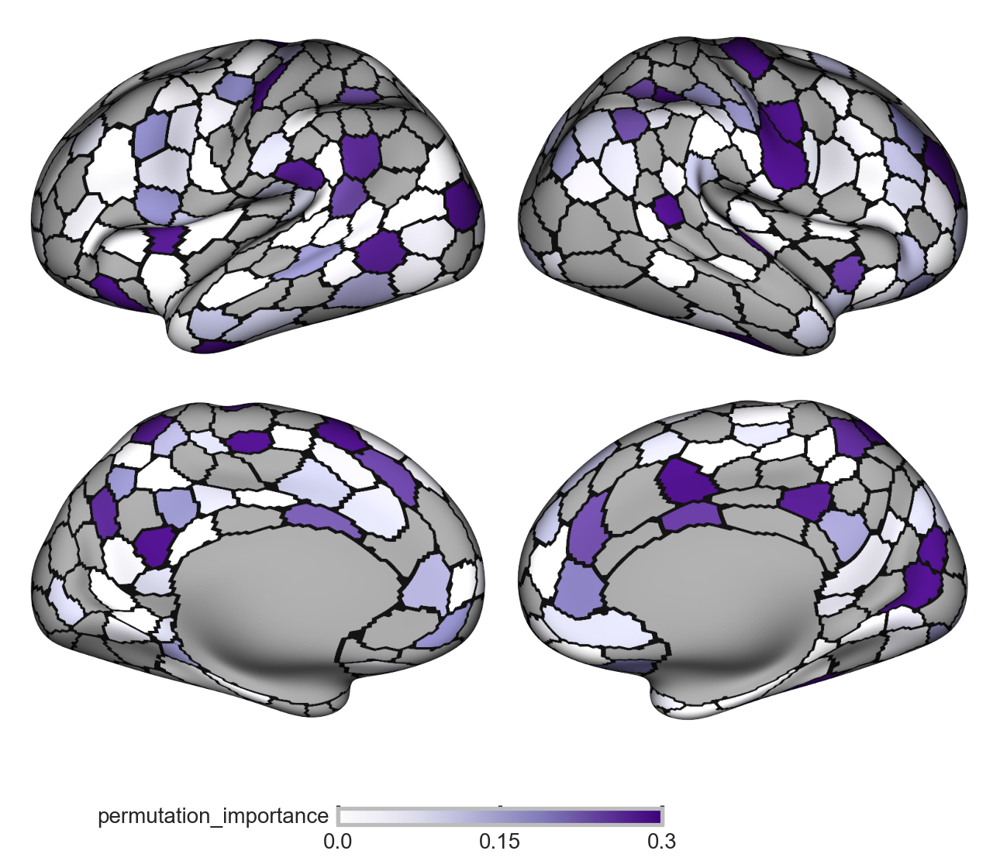

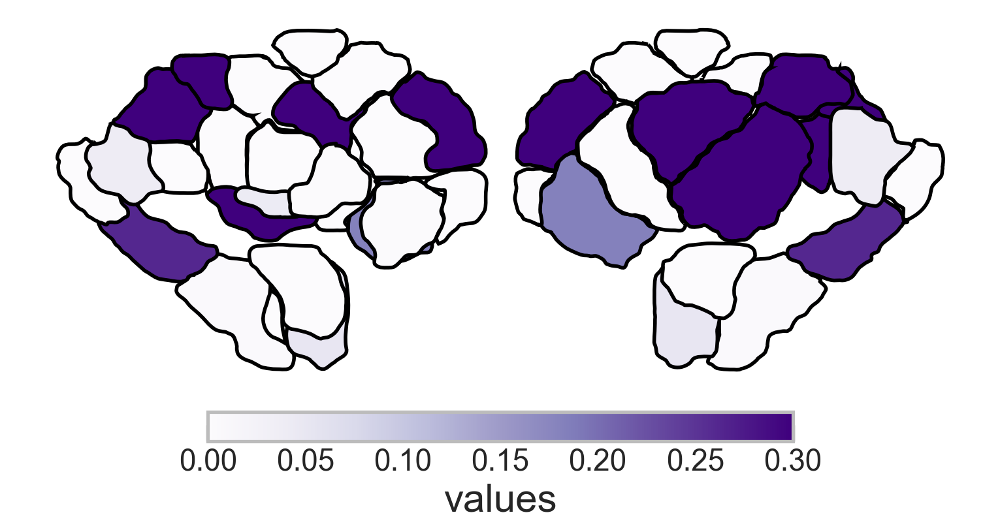

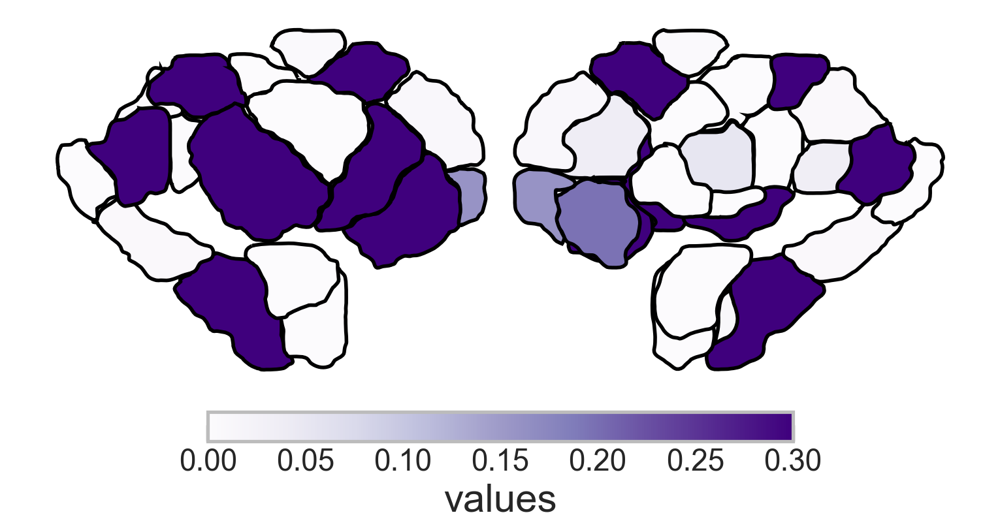

In [ ]:
from subcortex_visualization.plotting import plot_subcortical_data
# ---------------------------------------------------------------------
# 4.  MAP REGION IDs → METRIC VALUES
#     vertices with label 0 (background) → NaN so they render transparent
# ---------------------------------------------------------------------
p_threshold = 0.05
# value_threshold = shap_imp["permutation_importance"].quantile(0.8)  # 95th percentile of absolute importance

value_threshold = 0

value_map = {}
value_map_subcortex = {"region": [], "value": [], "Hemisphere": []}

vmin = 0
# vmax = shap_imp["permutation_importance"].quantile(0.95)  # 95th percentile of absolute importance
vmax = 0.3  # 95th percentile of absolute importance
cmap = "Purples"  # cmap for visualization

vis_df = shap_imp.copy()  # Use the stacked_models DataFrame

# vis_df = stats.copy()
# p_column = "p_val"
value_column = "permutation_importance"

value_map_lh = {}  # New: separate map for left hemisphere
value_map_rh = {}  # New: separate map for right hemisphere

for i, row in vis_df.iterrows():
    label = row[region_col]
    hemi_row = row["hemisphere"]  # Get hemisphere from your DataFrame row

    # Apply thresholds
    if np.abs(row[value_column]) >= value_threshold:
        value = row[value_column]
    else:
        value = np.nan  # Set to NaN if not significant or below value_threshold

    # Populate the correct hemisphere's value_map
    # Assuming your labels are global and you use the 'hemisphere' column to distinguish
    # If your Schaefer labels are already separated by hemi (e.g., 1-200 for LH, 201-400 for RH)
    # then you might only need to check the label range and not the 'hemisphere' column.
    # For Schaefer, the labels usually run 1-N for LH and N+1 - 2N for RH
    if "schaefer" in ATLAS:
        if label > int(ATLAS.split("_")[1]):
            value_map_subcortex["region"].append(label)
            value_map_subcortex["value"].append(value)
            value_map_subcortex["Hemisphere"].append(row["hemisphere"])
        else:
            if hemi_row == "L":
                value_map_lh[label] = value
            elif hemi_row == "R":
                value_map_rh[label] = value
        # Subcortex handling would go here if you were preparing for separate subcortical visualization
        # else: # This implies it's subcortical or other non-surface region
        #     value_map_subcortex["region"].append(label)
        #     value_map_subcortex["value"].append(value)
        #     value_map_subcortex["Hemisphere"].append(row["hemisphere"])

# Vectorize mapping for left and right hemispheres separately
vec_lh = np.vectorize(lambda x: value_map_lh.get(x, np.nan))
data_lh_mapped = vec_lh(lh_parc)  # Apply LH map to LH parcellation
vec_rh = np.vectorize(lambda x: value_map_rh.get(x, np.nan))
data_rh_mapped = vec_rh(rh_parc)  # Apply RH map to RH parcellation


p = Plot(
lh,
rh,
# Unpack the surface dictionary
# views=["medial", "lateral"],  # Show both medial and lateral for this hemi
size=(800, 600),  # px; change as needed
zoom=1.6,
layout="grid",  # Horizontal layout for side-by-side views
mirror_views=True,  # Set to False, as we are plotting one hemi at a time
)

# ---- main data layer -------------------------------------------------
# Pass only the data for the current hemisphere
# The dictionary now contains only one key-value pair for the current hemisphere
p.add_layer(
    {"left": data_lh_mapped, "right": data_rh_mapped},
    cmap=cmap,
    # cmap="coolwarm",
    #     # cmap="coolwarm",
    color_range=(vmin, vmax),  # Use symmetric range
    #     # norm=norm,  # Apply the symmetric normalization
    cbar_label=value_column,
    cbar=True,  # Ensure colorbar is shown for each plot if desired, or handle globally
)
# # ---- outline layer ---------------------------------------------------
p.add_layer({"left": lh_parc, "right": rh_parc}, cmap="gray", as_outline=True, cbar=False)

fig = p.build(
    # cbar_kws=dict(location="bottom", decimals=2, shrink=0.6)
)  # Added cbar_kws for better cbar display
# # save figure
# savefig_nice(
#     fig,
#     f"/media/storage/gepner/derivatives/gepner_{col}_cort_t.png",
#     tight=True,
#     dpi=300,
# )
    

subcort_df = pd.DataFrame(value_map_subcortex)
if "schaefer" in ATLAS:
    subcort_df["region"] = subcort_df["region"] - int(ATLAS.split("_")[1])


for hemi in ["L", "R"]:

    fig = plot_subcortical_data(
        subcort_df,
        atlas="Melbourne_S3",
        show_legend=True,
        hemisphere=hemi,
        cmap=cmap,
        line_color="black",
        line_thickness=2,
        vmin=vmin,
        vmax=vmax,
        show_figure=False,
    )

    # save figure
    # savefig_nice(
    #     fig,

    #     f"/media/storage/gepner/derivatives/subcortical_{col}_{hemi}_t.png",
    #     tight=True,
    #     dpi=300,
    # )
    # savefig_nice(fig, OUTPUT_DIR / f"fig2_subcort_{metric}_{hemi}_{value_column}.png", dpi=400)

In [ ]:
predictions_df = pd.DataFrame()
for metric in predictions:
    if "base_stacked" in metric:
        for i, row in parcels.iterrows():
            cur_df = predictions[metric][i][["True", "Predicted"]].copy()
            cur_df = cur_df.rename(columns={"True": f"base_{i}_age", "Predicted": f"base_{i}_predicted"})
            cur_df[f"base_{i}_BAG"] = cur_df[f"base_{i}_predicted"] - cur_df[f"base_{i}_age"]
            predictions_df = pd.concat([predictions_df, cur_df], axis=1)
        continue
    cur_df = (
        predictions[metric][["True", "Predicted"]]
        .copy()
        .rename(columns={"True": f"{metric}_age", "Predicted": f"{metric}_predicted"})
    )
    cur_df[f"{metric}_BAG"] = cur_df[f"{metric}_predicted"] - cur_df[f"{metric}_age"]
    predictions_df = pd.concat([predictions_df, cur_df], axis=1)


    
# w = predictions[best_metric]["weight"].to_numpy()


# # build a model to predict the residuals
# import statsmodels.api as sm
# from statsmodels.formula.api import ols
# import statsmodels.formula.api as smf

# # Fit a linear model to the residuals
# df["residuals"] = residuals
# model = ols("residuals ~ age", data=df).fit()
# # use the model to "fix" the predictions
# df["fixed_predicted"] = df["predicted"] + model.resi

In [ ]:
predictions_df.to_csv("BAG_data.csv")